# Subclustering of mesoderm in bcd-RNAi data

In [1]:
#load packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv

In [3]:
#load data
seu_HQC <- readRDS(file = '../../data/seurat_object/bcdRNAi/seu_HQC2_bcdRNAi.obj')
seu_HQC

An object of class Seurat 
28612 features across 6473 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


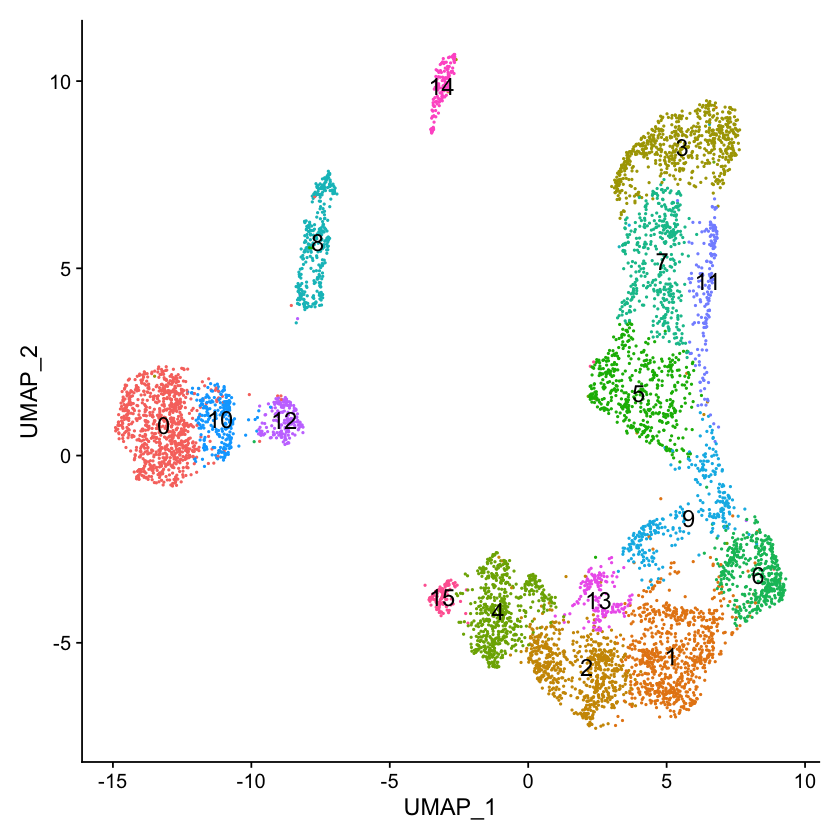

In [4]:
Idents(seu_HQC) <- 'seurat_clusters'
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, label.size = 5) + NoLegend()

## Trunk mesoderm
### Picking up target clusters

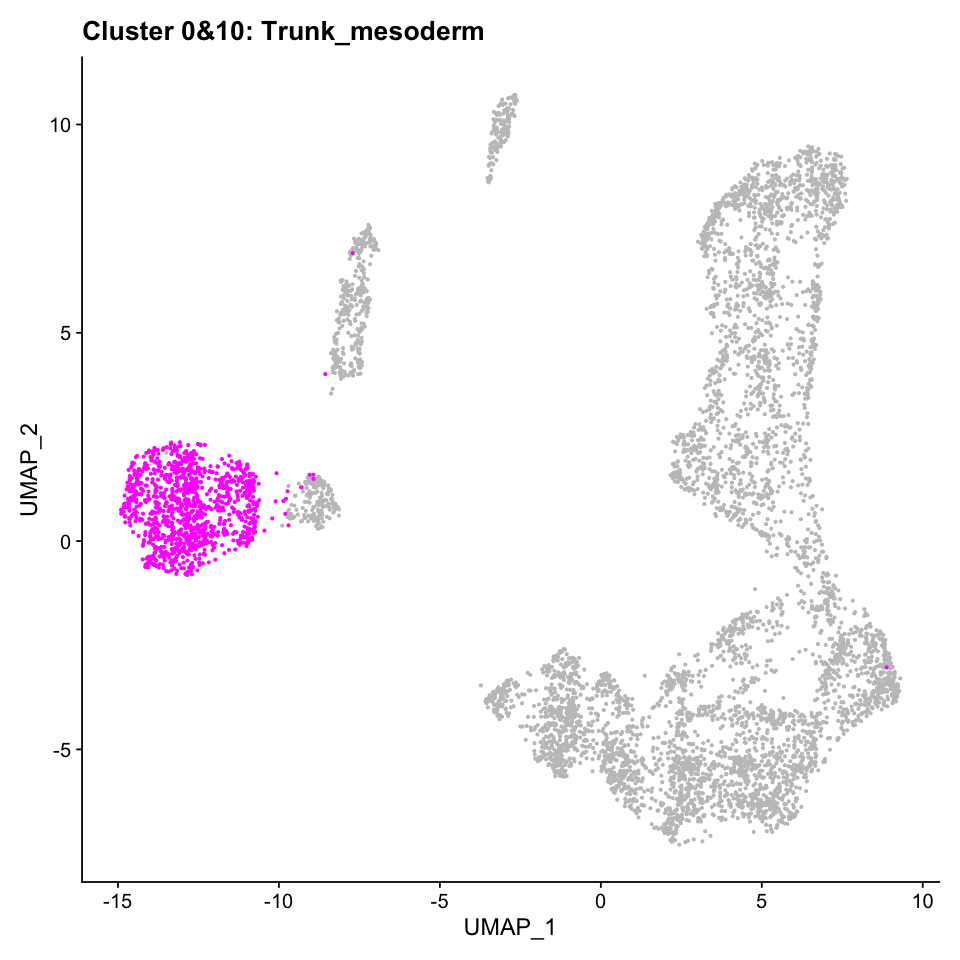

In [5]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(0,10))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 0&10: Trunk_mesoderm')

In [6]:
seu.trunk.meso <- subset(seu_HQC, idents = c(0,10))
seu.trunk.meso$cluster.allcell <- seu.trunk.meso$seurat_clusters
seu.trunk.meso

An object of class Seurat 
28612 features across 1110 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

### Re-normalization and clustering

In [7]:
#num of cell > 500
DefaultAssay(seu.trunk.meso) <- "RNA"
seu.trunk.meso <- suppressWarnings(SCTransform(seu.trunk.meso, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


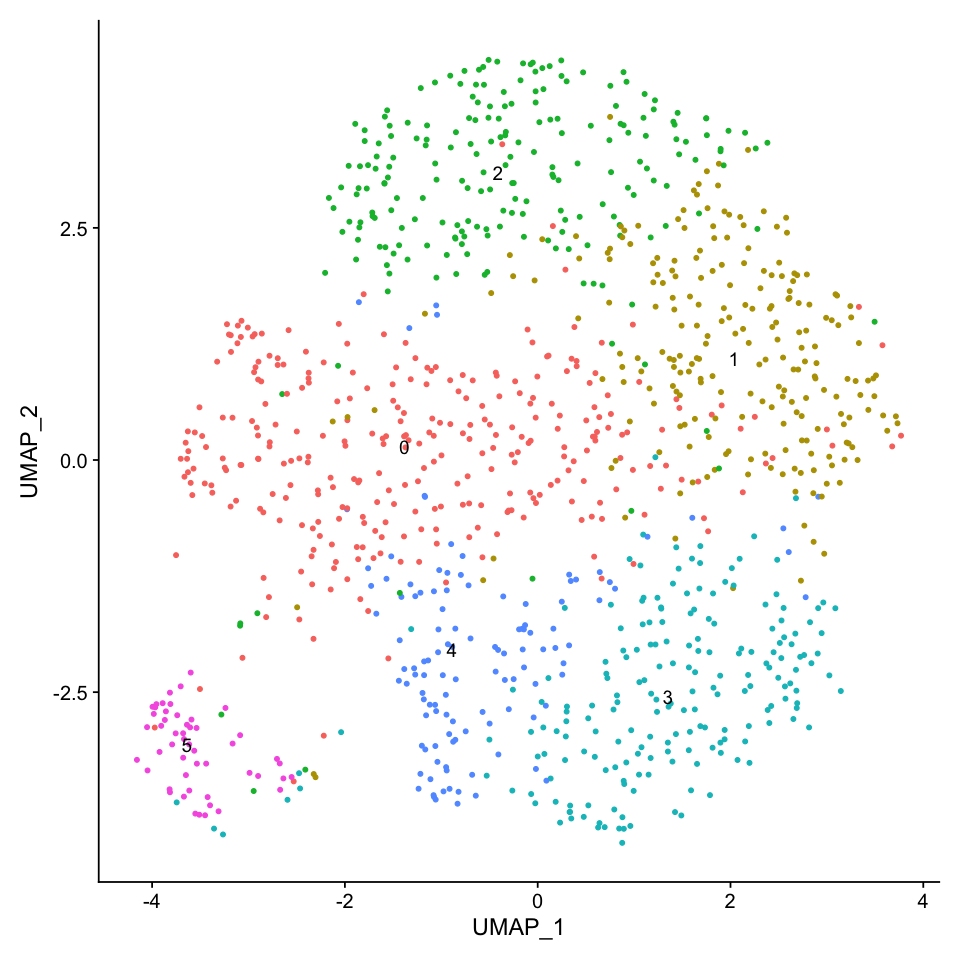

In [8]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso, verbose = FALSE)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30, verbose = FALSE)
seu.trunk.meso <- FindClusters(seu.trunk.meso, verbose = FALSE)
DimPlot(seu.trunk.meso, reduction =  "umap", label = TRUE) + NoLegend()

In [9]:
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



[1] 341

[1] 60

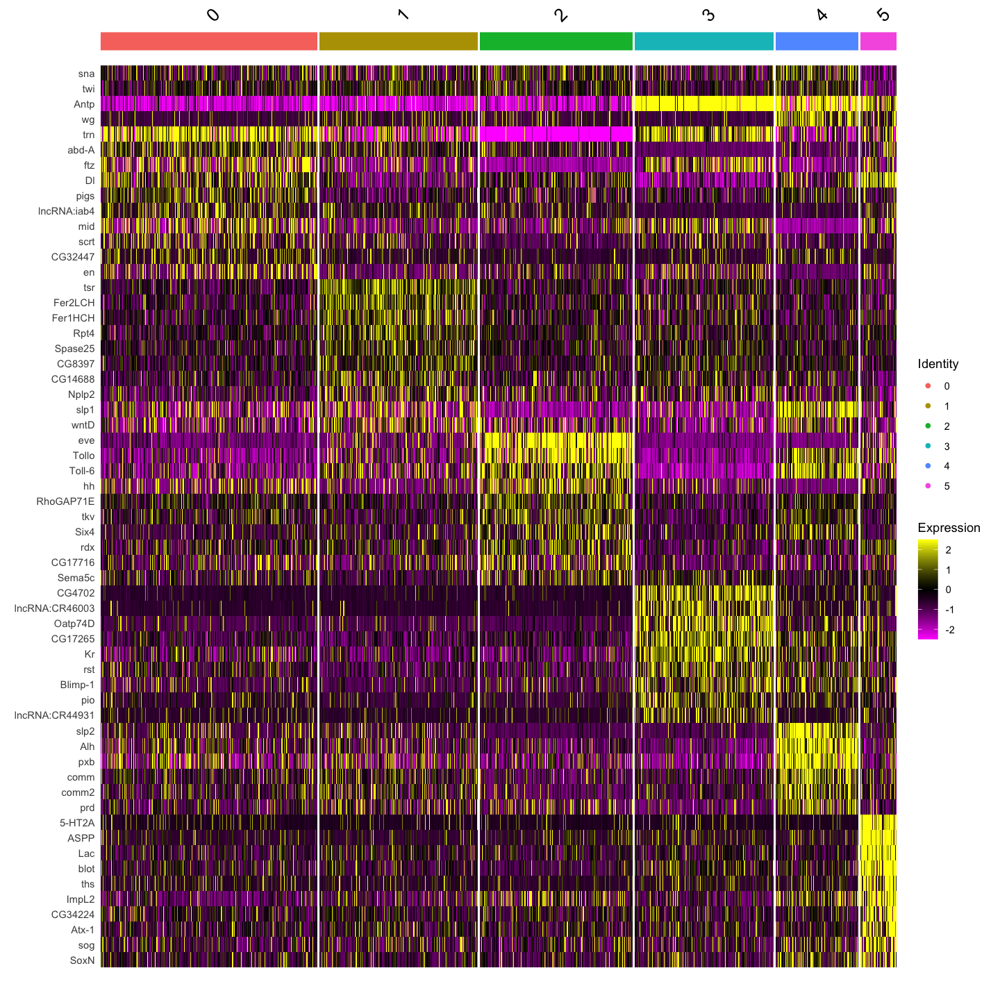

In [10]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c("sna", "twi", "Antp","wg", all.markers.meso.top10$gene))

Cluster 5 expresed ectoderm markers (doublets)

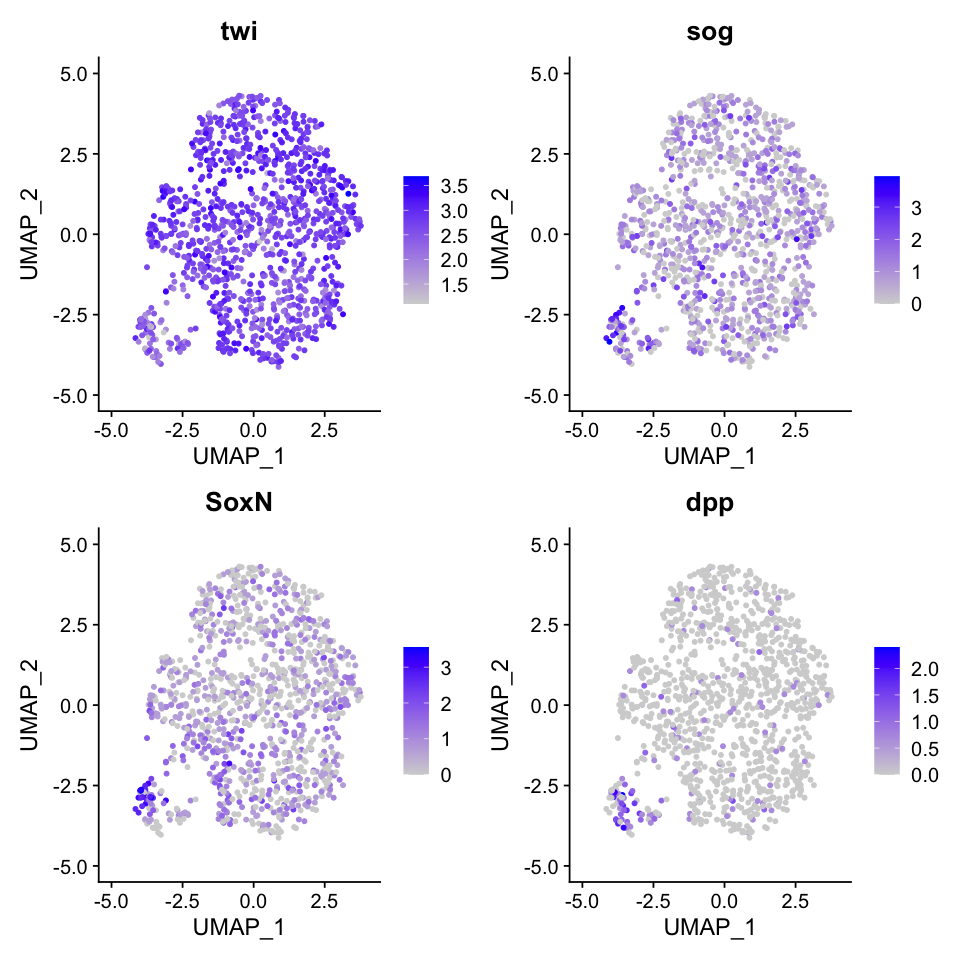

In [11]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("twi","sog","SoxN","dpp"), 
            pt.size = 1,  ncol = 2, )

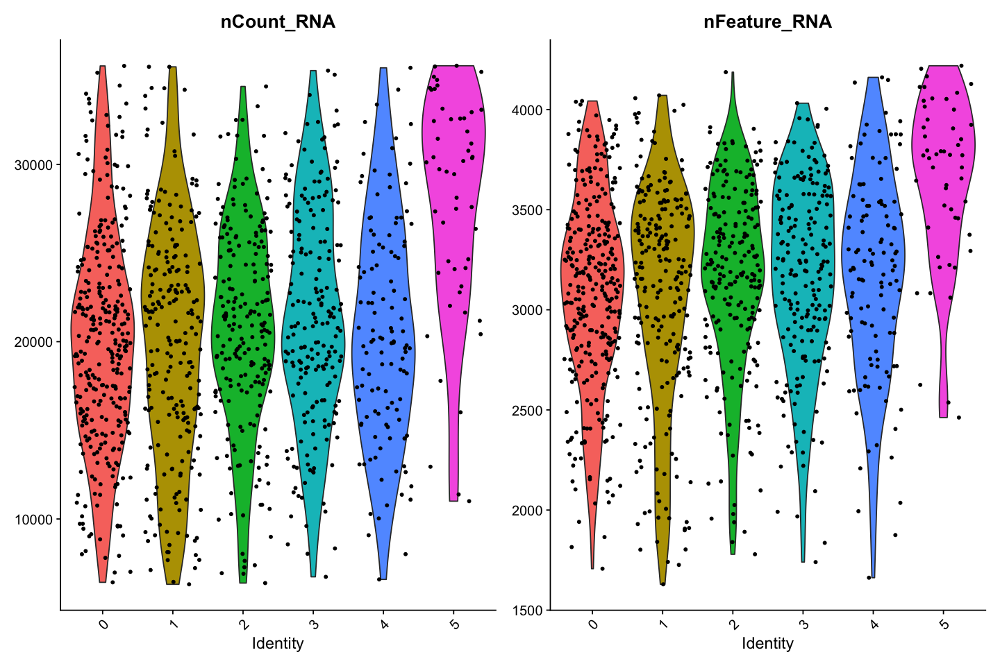

In [12]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu.trunk.meso, features = c('nCount_RNA','nFeature_RNA'))

Cluster 5 shows higher total UMI count and nuber of detected genes, suggesting it is doublet clusters

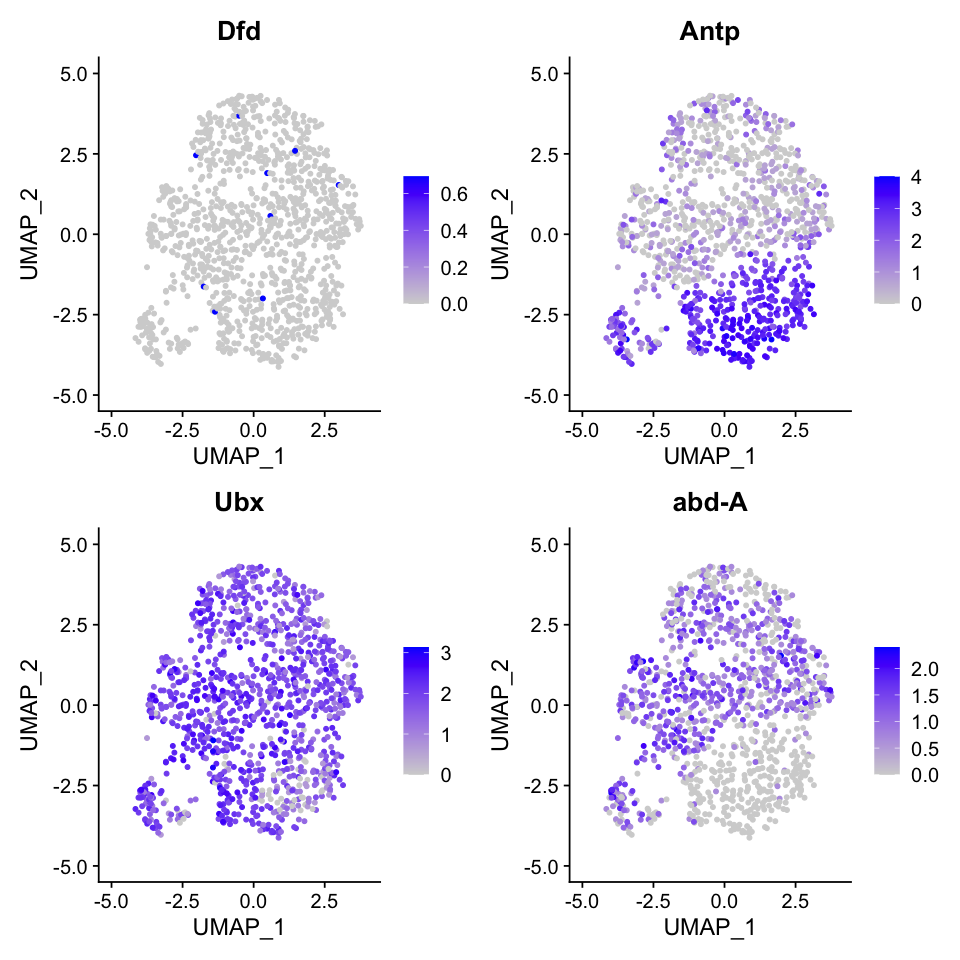

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("Dfd","Antp","Ubx","abd-A"), 
            pt.size = 1,  ncol = 2, )

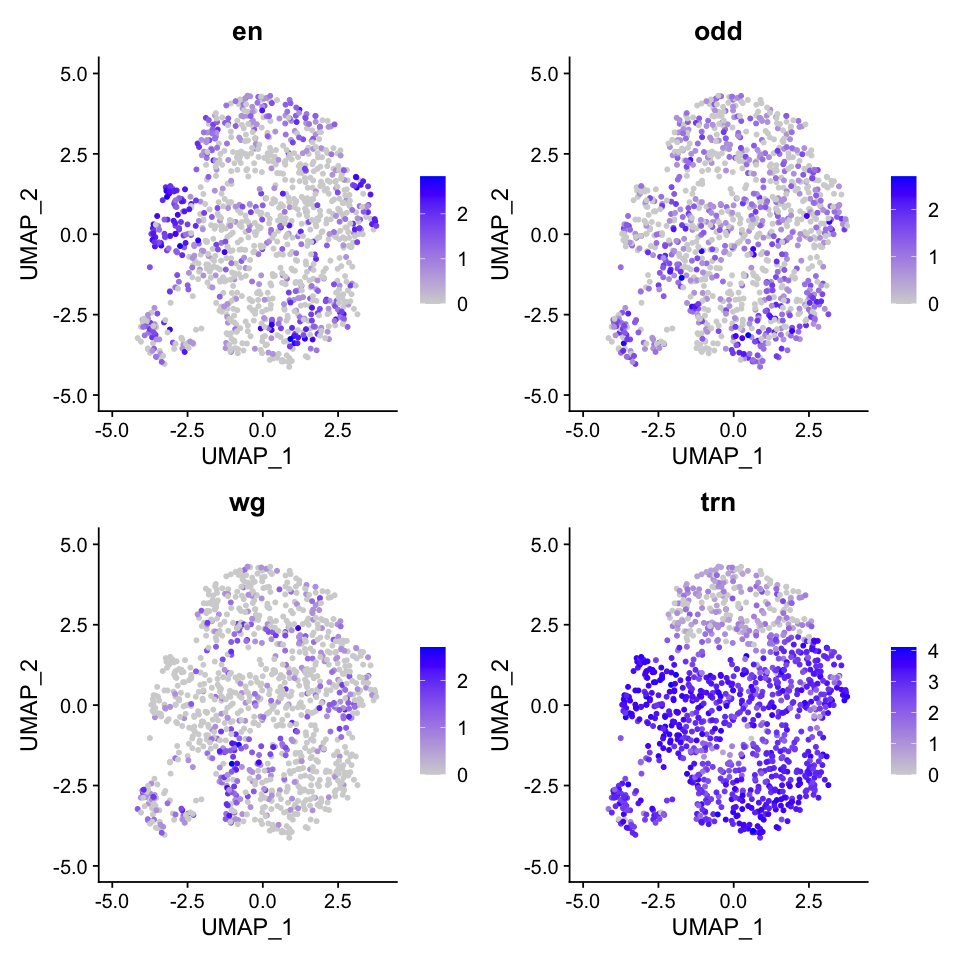

In [14]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("en","odd","wg","trn"), 
            pt.size = 1,  ncol = 2,)

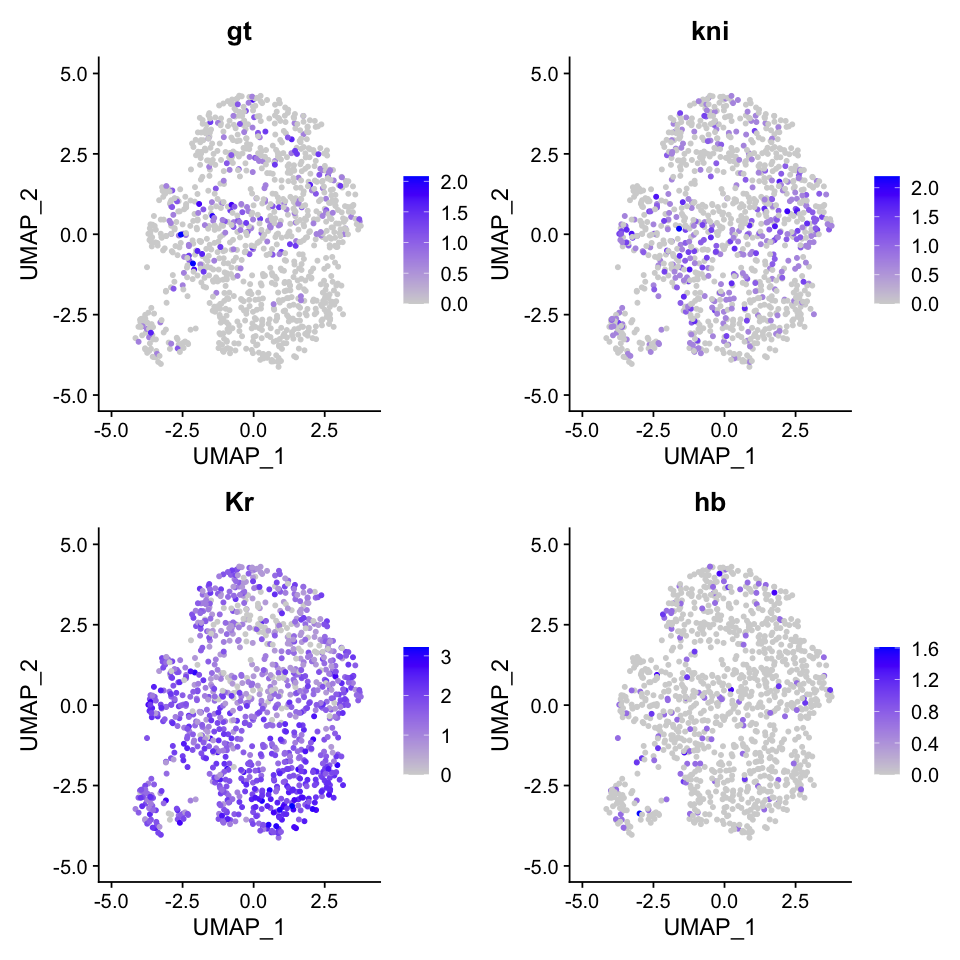

In [15]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("gt","kni","Kr","hb"), 
            pt.size = 1,  ncol = 2, )

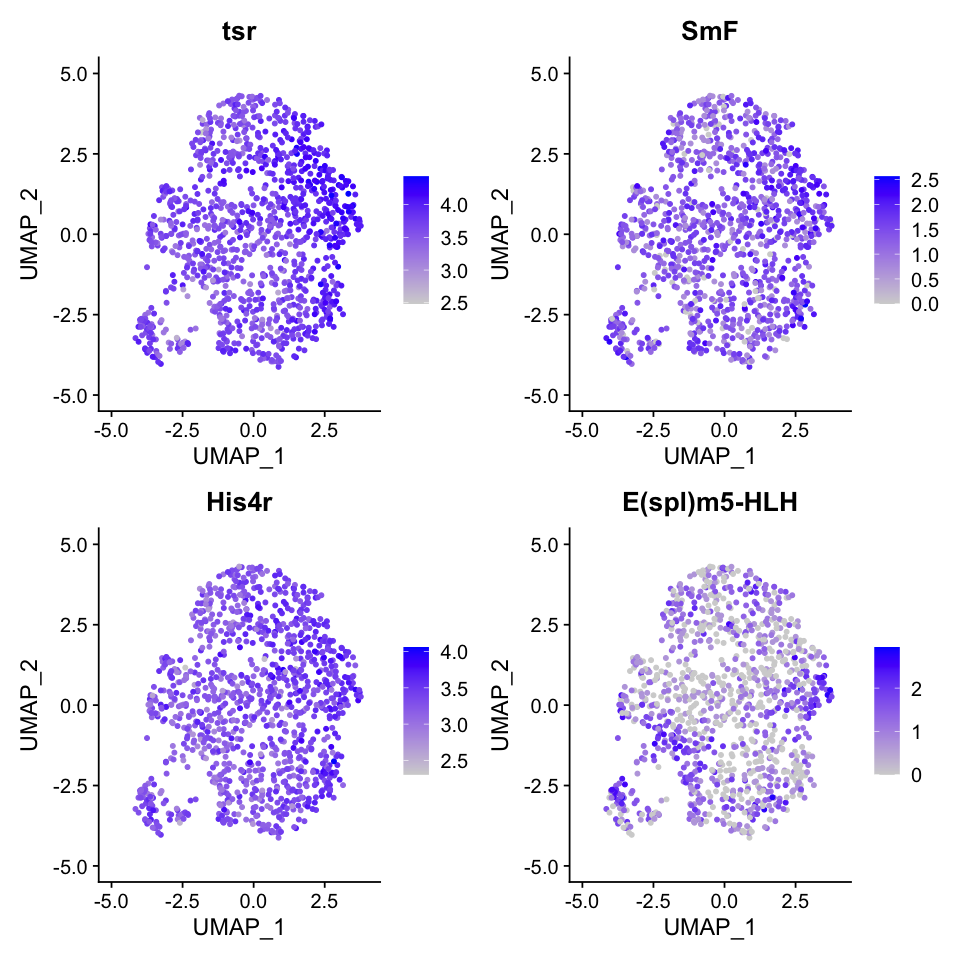

In [16]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("tsr","SmF","His4r","E(spl)m5-HLH"), 
            pt.size = 1,  ncol = 2)

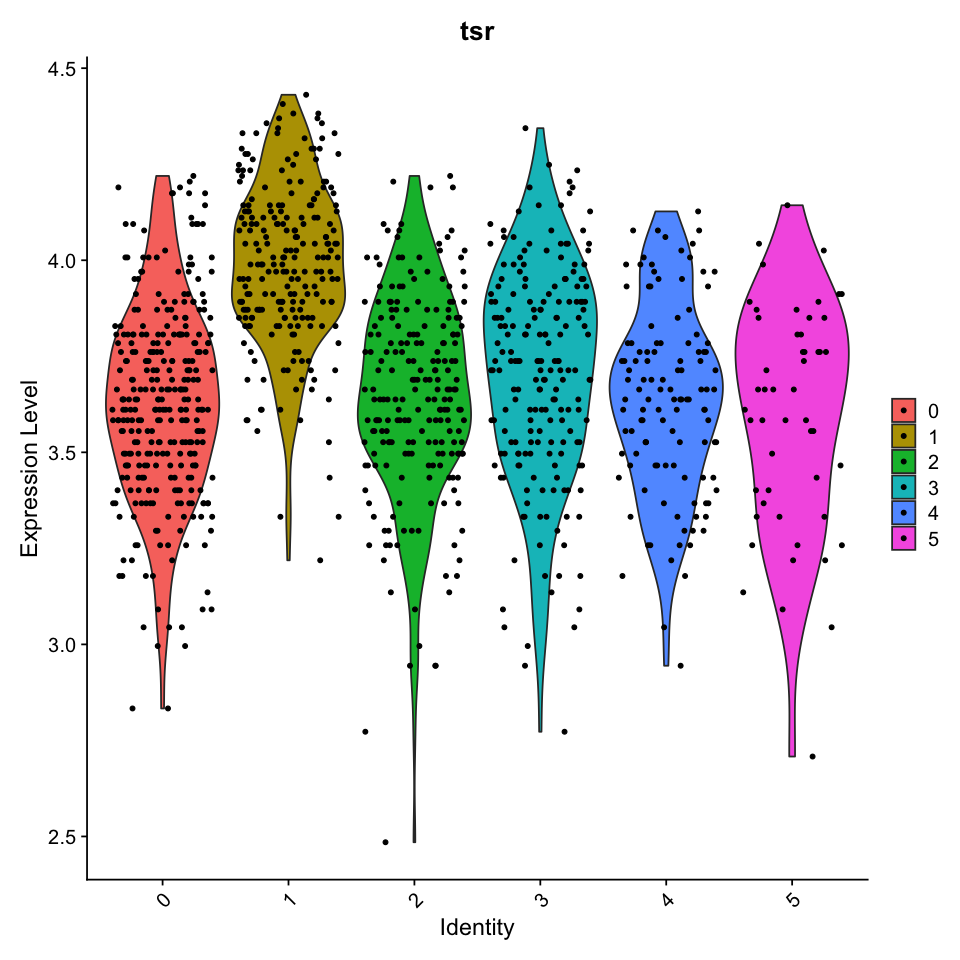

In [17]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(seu.trunk.meso, features = c('tsr'))

cluster 1 shows as high expression of tsr as cells removed before.

### Remove doublets and stressed cells

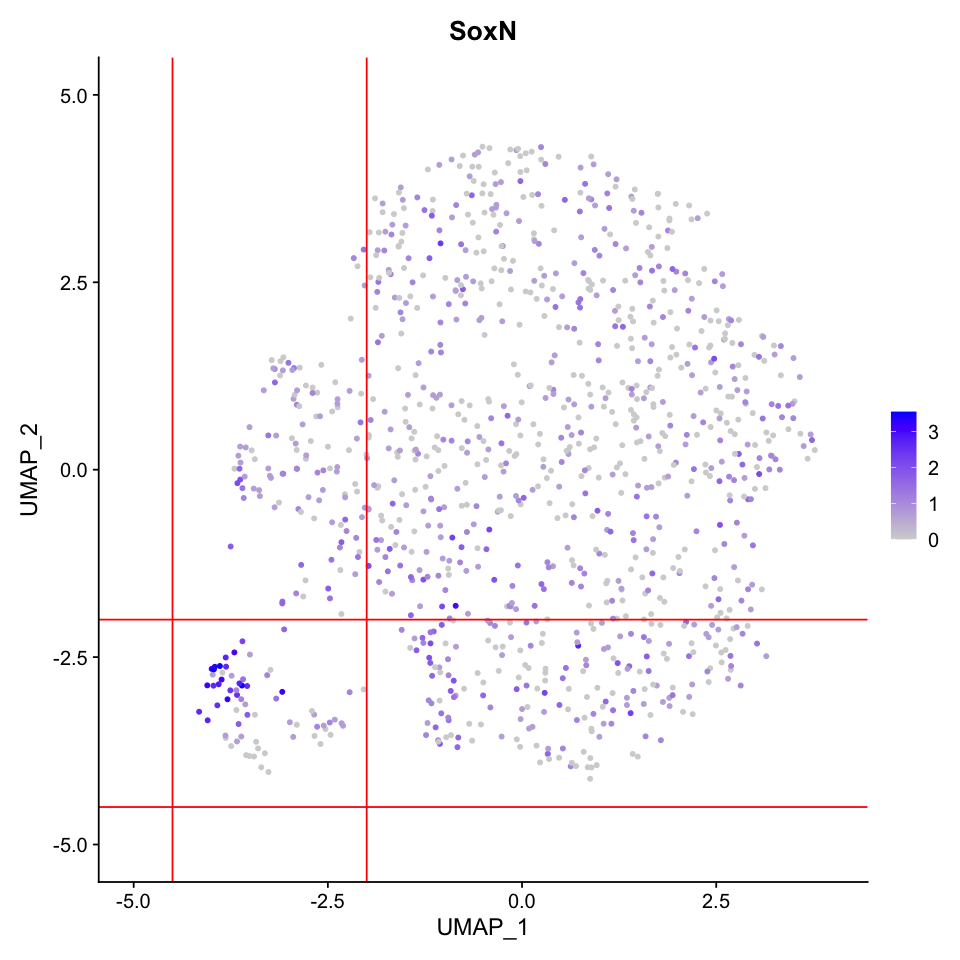

In [18]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, features = 'SoxN', reduction =  "umap") + 
geom_vline(xintercept=-4.5, colour="red") + 
geom_vline(xintercept=-2.0, colour="red") + 
geom_hline(yintercept= -4.5, colour="red") + 
geom_hline(yintercept=-2.0, colour="red")

In [19]:
seu_HQC_meso_umap <- Embeddings(seu.trunk.meso, reduction = "umap")
seu_HQC_meso_umap <- as.data.frame(seu_HQC_meso_umap)
dim(seu_HQC_meso_umap)
seu_HQC_meso_umap <- seu_HQC_meso_umap %>% rownames_to_column("cellID")
head(seu_HQC_meso_umap)

[1] 1110    2

,cellID,UMAP_1,UMAP_2
,<chr>,<dbl>,<dbl>
1,AAACCCAGTTGTGGAG,1.9654255,2.395390
2,AAACGAAGTTCCGCTT,-3.1840309,1.343708
3,AAACGCTGTCAACGCC,-0.2630806,-3.559869
4,AAAGGATTCAATCTTC,2.6142664,1.819040
5,AAAGGATTCTCAATCT,-0.9871066,-1.605975
6,AAAGGGCAGATAACGT,-1.5492606,-2.136669


In [20]:
seu_HQC_meso_umap_doublet <- filter(seu_HQC_meso_umap, UMAP_1 >-4.5 & UMAP_1 < -2.0 & UMAP_2 > -4.5 & UMAP_2 < -2.0)

In [21]:
dim(seu_HQC_meso_umap_doublet)

[1] 68  3

In [22]:
doublet_list <- seu_HQC_meso_umap_doublet$cellID
doublet_list

[1] "AACCATGAGCCATATC" "AACCCAAGTTCTTAGG" "AATCGTGTCCCAATAG" "ACACCAAAGCTTCATG"
 [5] "ACACGCGGTTCGTTCC" "ACATCCCGTATGGGAC" "ACCCTCATCAGCTCTC" "ACGATCAAGGATTCCT"
 [9] "ACGGTCGAGGCGATAC" "ACTATTCCAGAGAAAG" "ACTATTCTCTCGACGG" "AGAAGTACAGTCAGCC"
[13] "AGGACGAGTCGGTGAA" "AGGGTGAAGCCATGCC" "AGGTTGTAGGAGTCTG" "AGTGATCTCTCTGCCA"
[17] "AGTGTTGGTGGAACAC" "ATATCCTCATTGAGGG" "ATGTCCCCAGAGTTCT" "ATTCAGGAGCCTGAGA"
[21] "ATTGGGTCATATGGCT" "ATTTCTGGTTGATCGT" "CAACAACCATCTTTCA" "CAAGCTAAGTGGATAT"
[25] "CACGGGTTCACTCTTA" "CATGCGGGTGTTGATC" "CATGGATGTCTCTCCA" "CATGGATGTTAGGAGC"
[29] "CCATCACCAAGTGACG" "CCATCACTCCCGAATA" "CCGGACAGTATCGTAC" "CCGTAGGCAGCACACC"
[33] "CGCGTGAGTGGAGGTT" "CGTAGTACACTCAAGT" "CGTAGTATCTGGGCAC" "CGTGATAGTCTAGGCC"
[37] "CTGATCCCAAGTGATA" "GAAGAATAGTCAGCGA" "GACTCAAGTTGGGATG" "GAGAAATGTATCTCTT"
[41] "GAGGGATGTAGTATAG" "GAGTGAGGTCGAGTGA" "GCCGATGCATCCGTTC" "GCGGATCTCTTAGTTC"
[45] "GCTGCAGTCTTCGTAT" "GCTGGGTGTAATGCGG" "GCTTCACTCGAAGCAG" "GGGACCTGTACTTGTG"
[49] "GGGAGTACACCAGGTC" "GGGATCCCAAGCTCTA" "GGGCTACCAGATAAAC" "GGTAGAGAGGTTACAA"
[53] "GGTTCTCAGCGATGAC" "GTCTTTACATGTTCAG" "GTTATGGAGTGCAGCA" "GTTCATTGTGGTCTGC"
[57] "TACTTGTCATTACGGT" "TAGGGTTGTCCCGTGA" "TCATGGATCGGCACTG" "TCCTTCTTCAGTCAGT"
[61] "TCTGTCGAGTAATACG" "TGATCAGAGAGAATCT" "TGCAGGCTCCCGTGAG" "TGCGGGTCACTTGACA"
[65] "TGGATCAAGCAAACAT" "TGTCAGACAAACTAGA" "TTGCTGCAGTCATGGG" "TTGCTGCGTGCCCGTA"

In [23]:
seu_HQC_meso_umap_singlet <- filter(seu_HQC_meso_umap, !cellID %in% doublet_list)
dim(seu_HQC_meso_umap_singlet)

[1] 1042    3

In [24]:
singlet_list <- seu_HQC_meso_umap_singlet$cellID
length(singlet_list)

[1] 1042

In [25]:
seu.doublet <- seu.trunk.meso[, doublet_list]
seu.doublet$manual_ID <- 'doublet'
seu.trunk.meso <- seu.trunk.meso[, singlet_list]
seu.stressed.cells <- subset(seu.trunk.meso, idents = 1)
seu.stressed.cells$manual_ID <- 'stressed_cells'
seu.trunk.meso <- subset(seu.trunk.meso, idents = 1, invert = T)
seu.trunk.meso

An object of class Seurat 
26532 features across 820 samples within 2 assays 
Active assay: SCT (9028 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

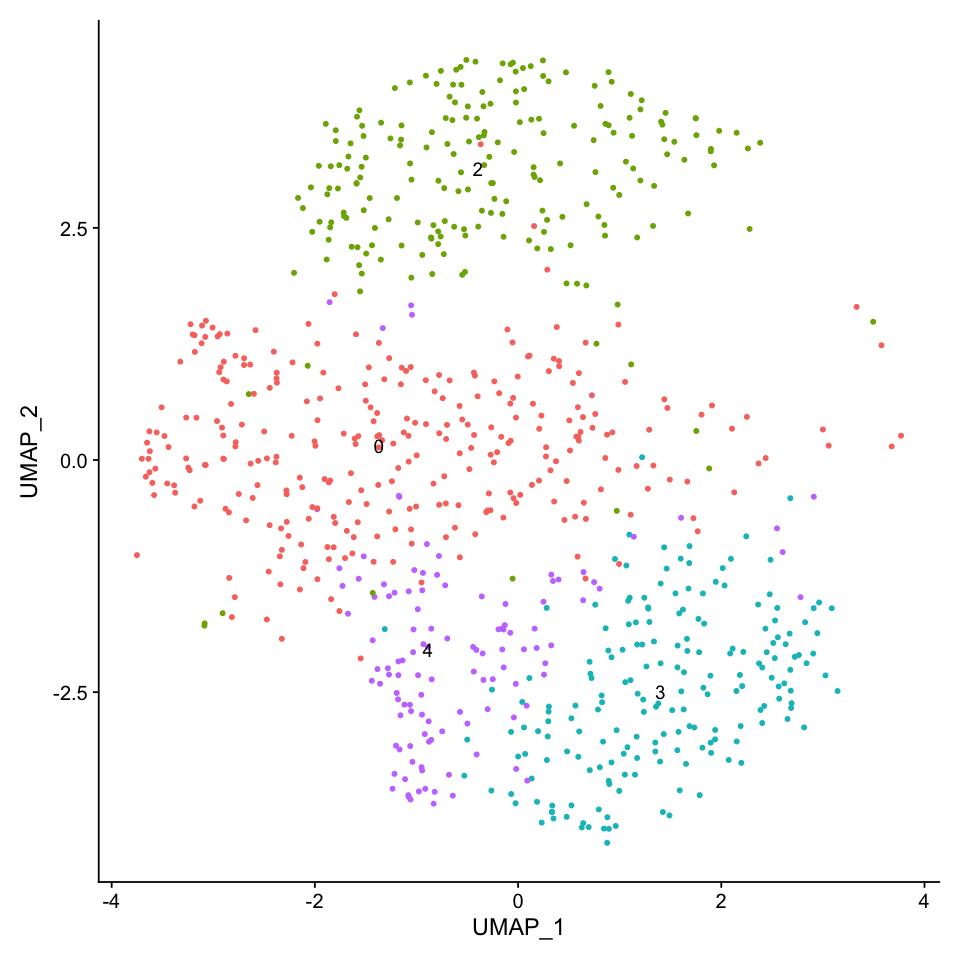

In [26]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso, reduction =  "umap", label = TRUE) + NoLegend()

### Clustering again without doublets and stressed cells

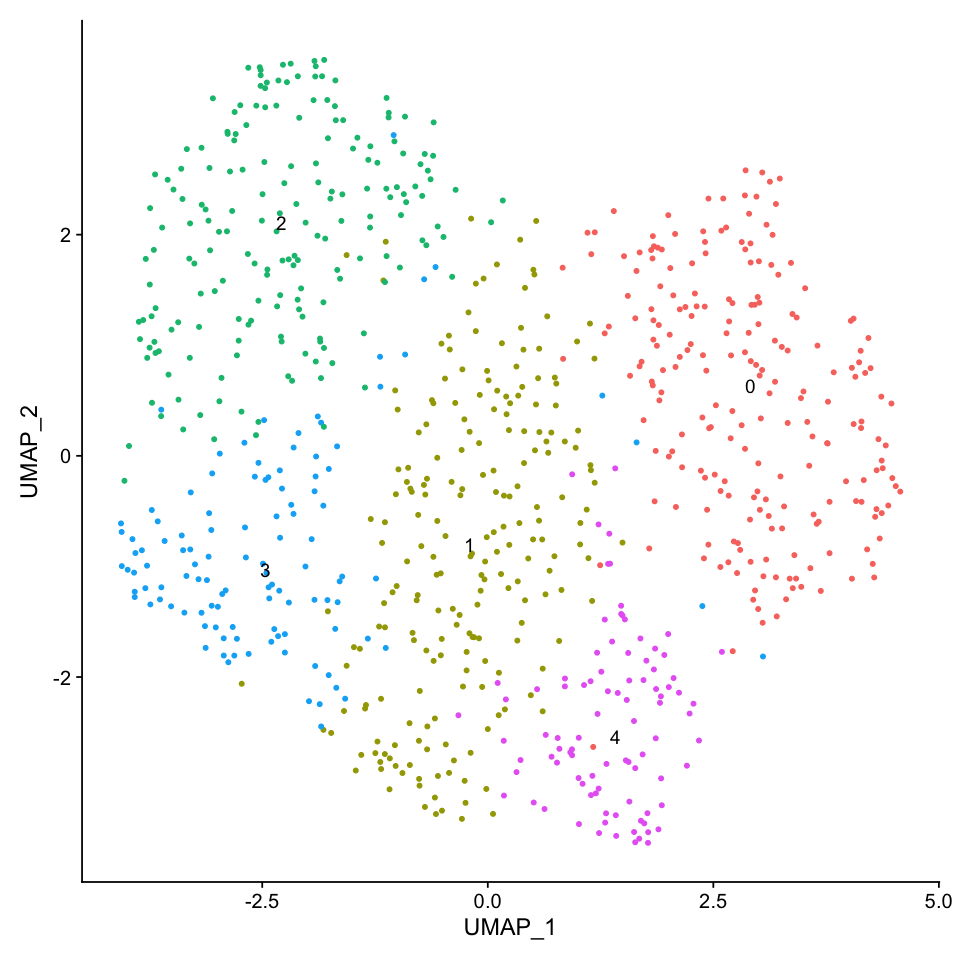

In [27]:
options(repr.plot.width=8, repr.plot.height=8)
seu.trunk.meso <- RunPCA(seu.trunk.meso, verbose = FALSE)
seu.trunk.meso <- RunUMAP(seu.trunk.meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu.trunk.meso <- FindNeighbors(seu.trunk.meso, dims = 1:30, verbose = FALSE)
seu.trunk.meso <- FindClusters(seu.trunk.meso, verbose = FALSE)
DimPlot(seu.trunk.meso, reduction =  "umap", label = TRUE) + NoLegend()

In [28]:
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



[1] 118

[1] 50

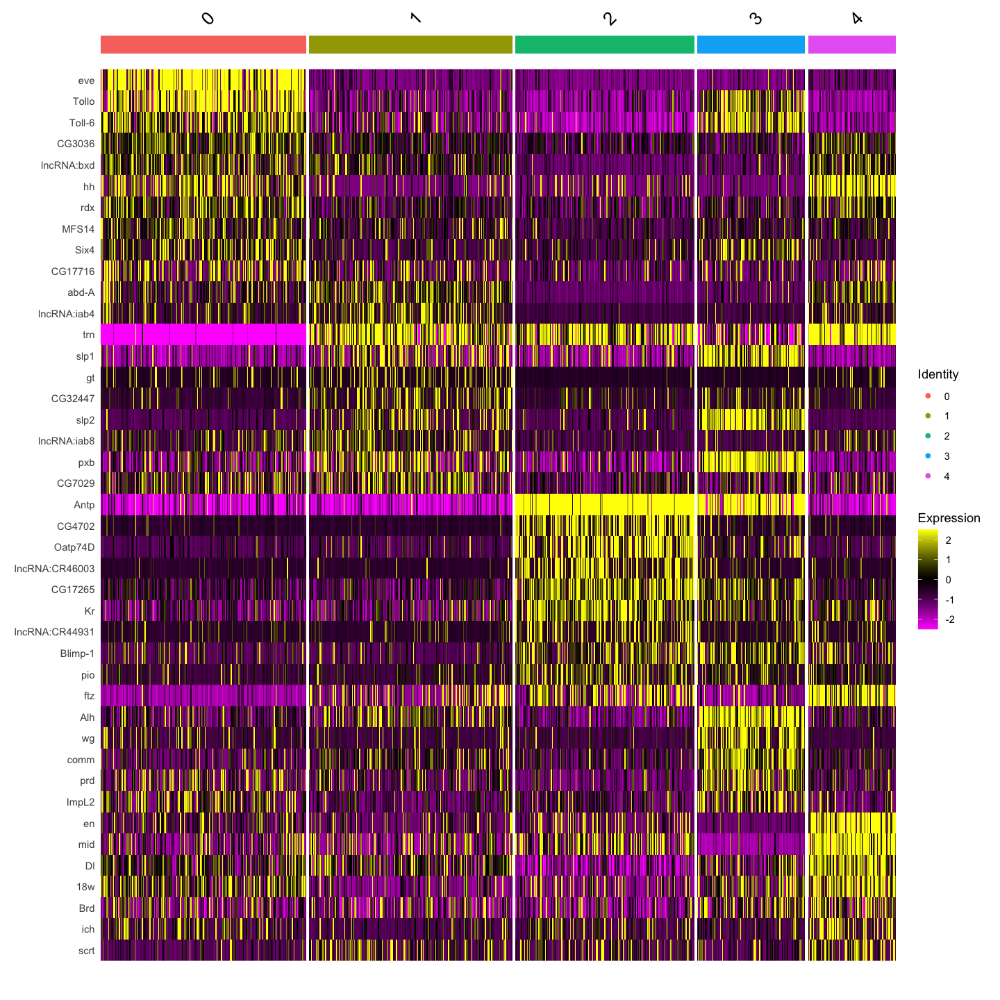

In [29]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene))

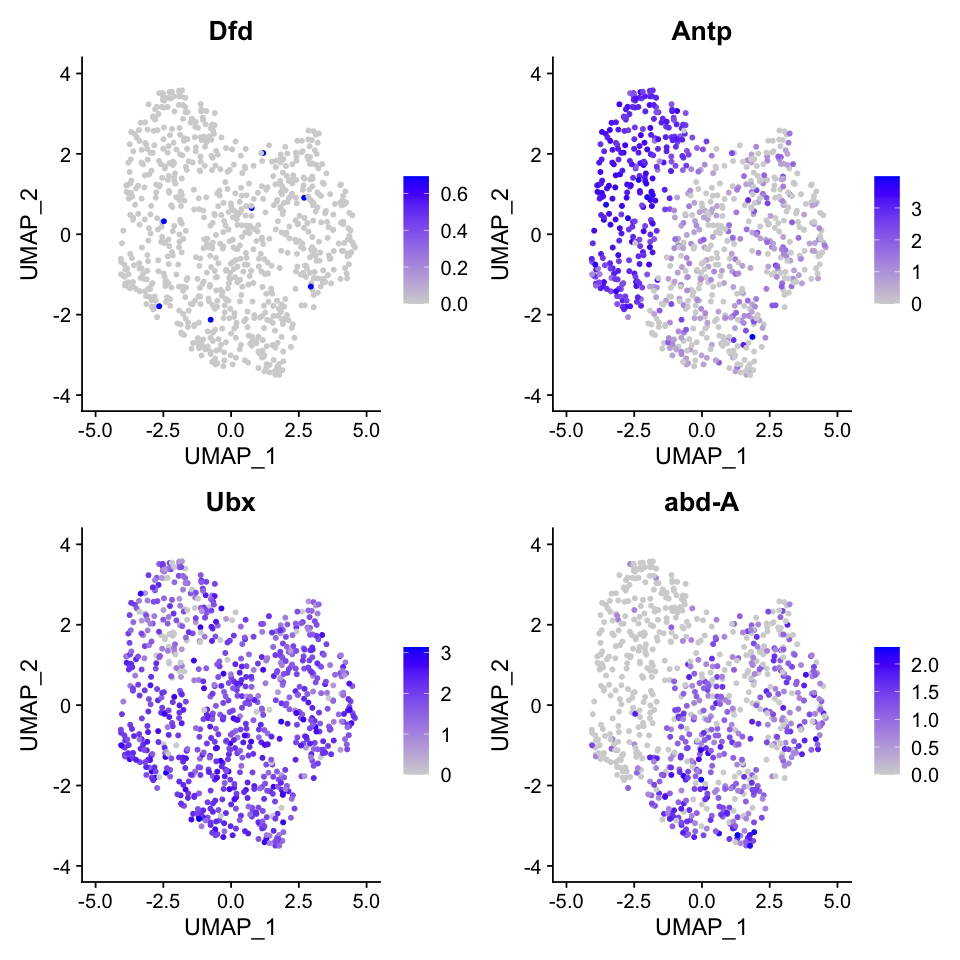

In [30]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("Dfd","Antp","Ubx","abd-A"), 
            pt.size = 1,  ncol = 2)

All clusters expressed Ubx, indicating they have identities corresponing to PS5 or more posterior.

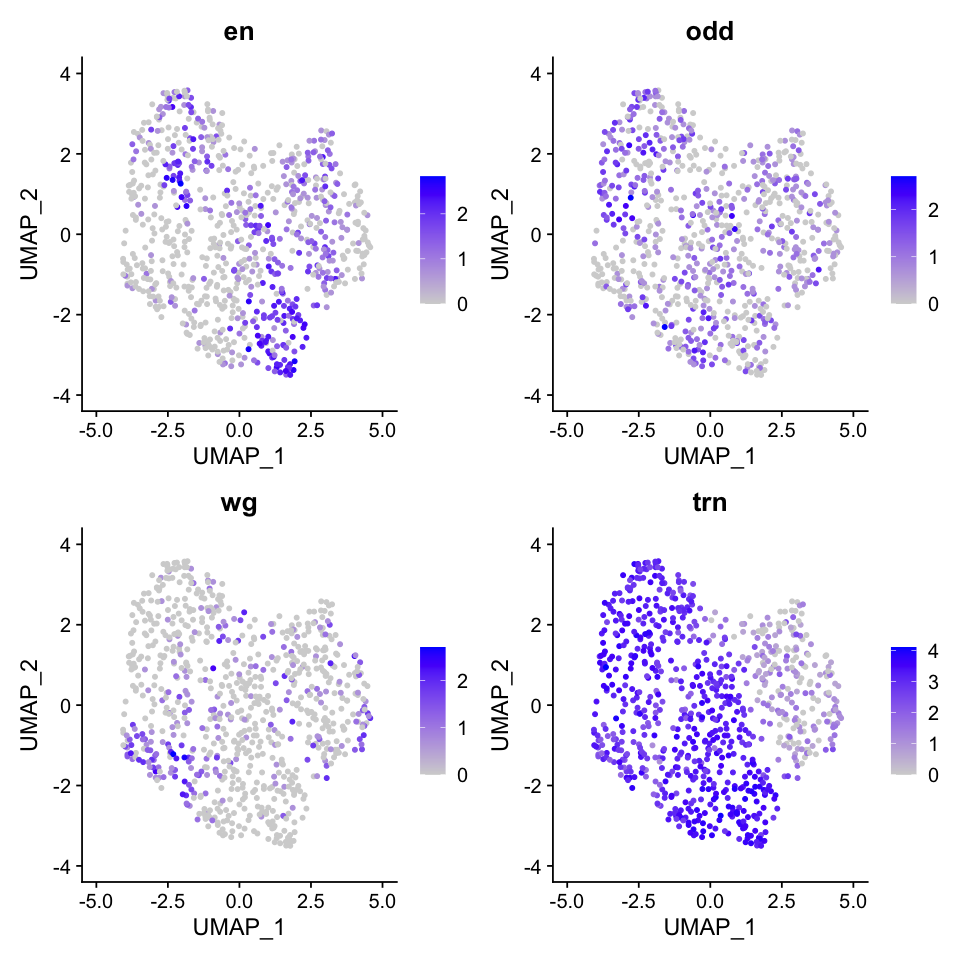

In [31]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("en","odd","wg","trn"), 
            pt.size = 1,  ncol = 2)

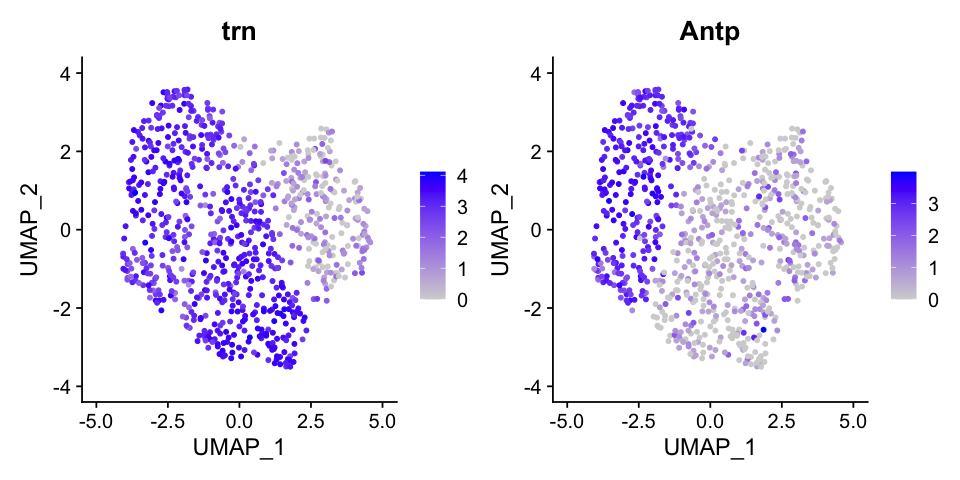

In [32]:
options(repr.plot.width=8, repr.plot.height=4)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("trn","Antp"), 
            pt.size = 1,  ncol = 2)

All of Antp+ cells expressed trn, suggesting they have identities of PS4 and PS6

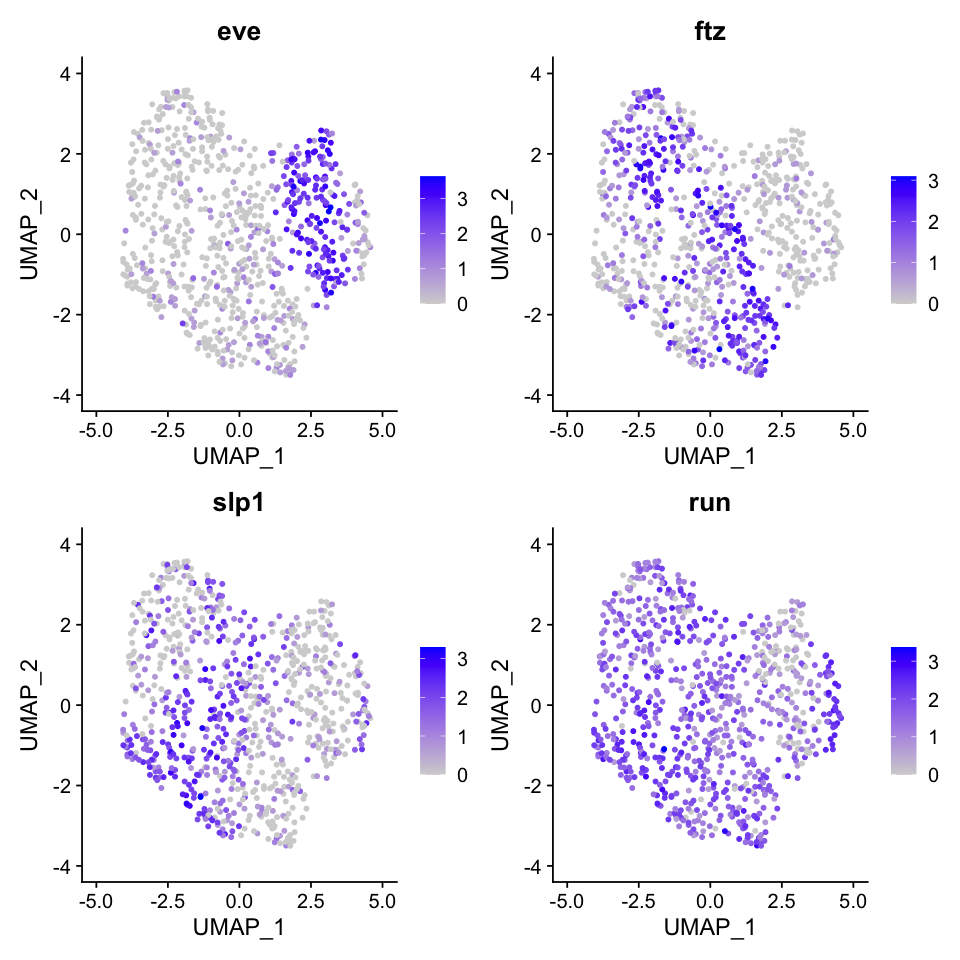

In [33]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("eve","ftz","slp1","run"), 
            pt.size = 1,  ncol = 2)

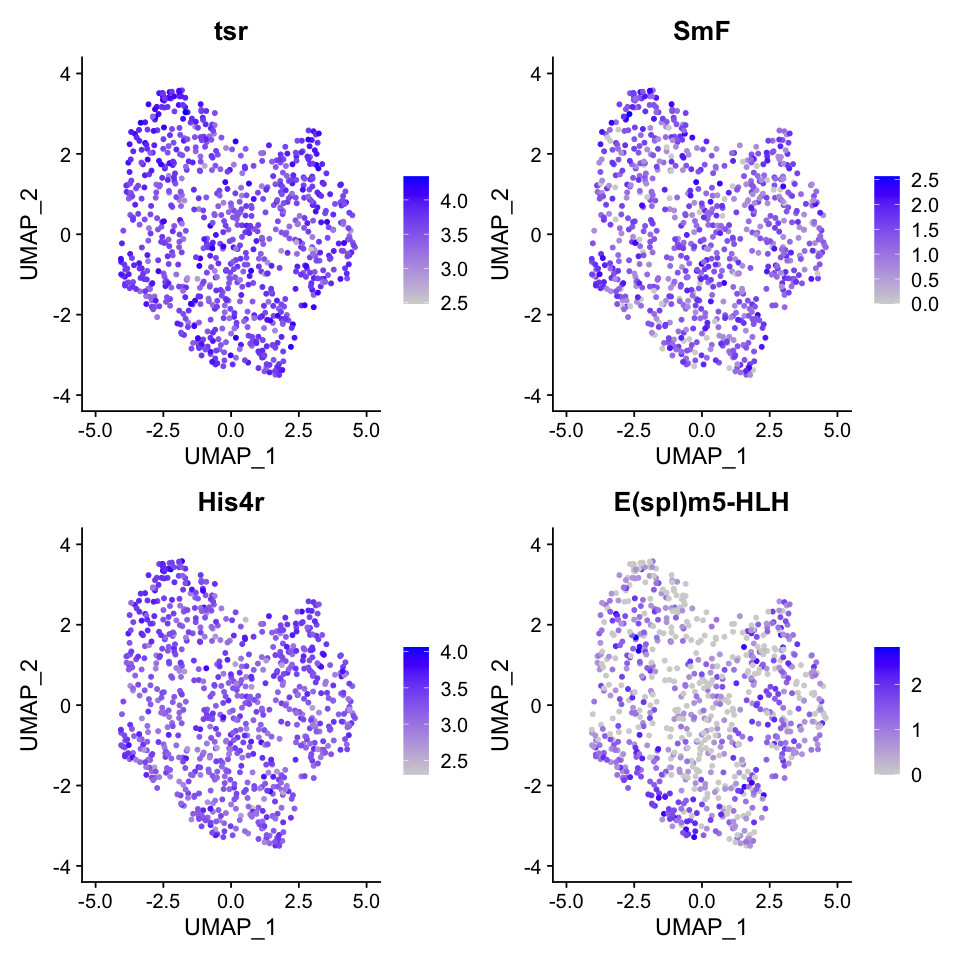

In [34]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("tsr","SmF","His4r","E(spl)m5-HLH"), 
            pt.size = 1,  ncol = 2)

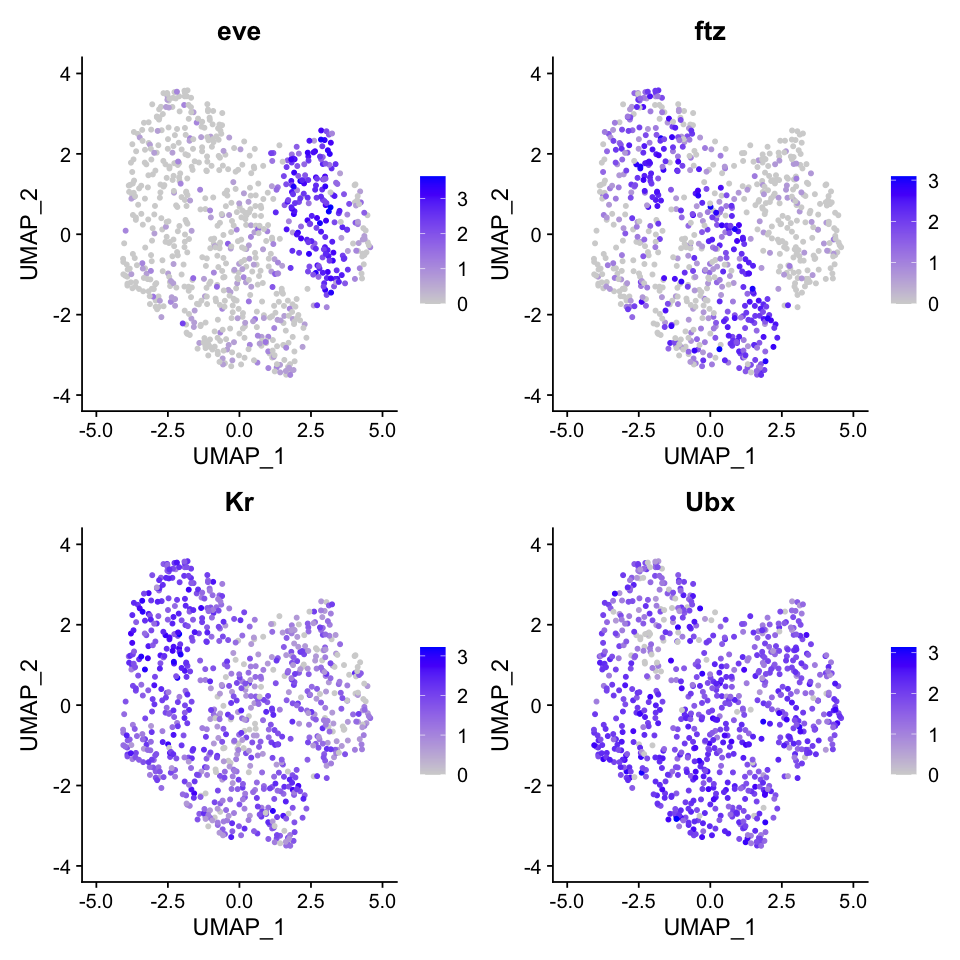

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("eve","ftz","Kr","Ubx"), 
            pt.size = 1,  ncol = 2)

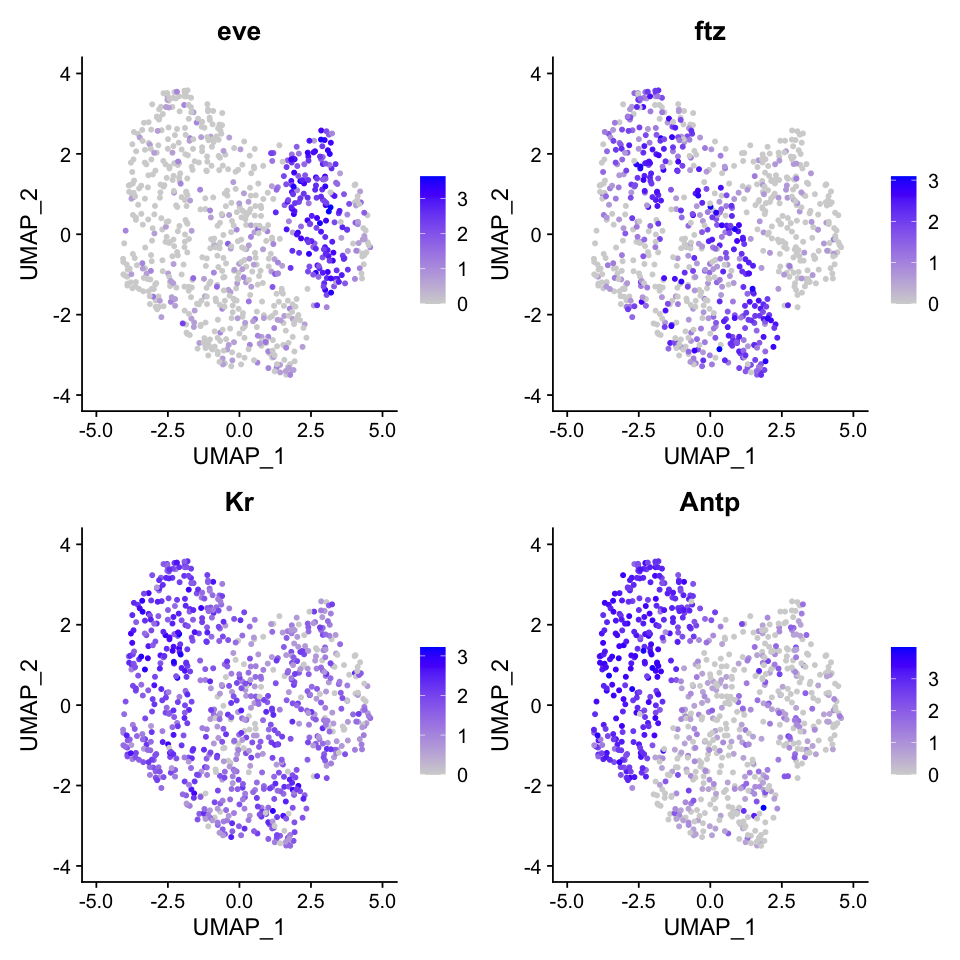

In [36]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("eve","ftz","Kr","Antp"), 
            pt.size = 1,  ncol = 2)

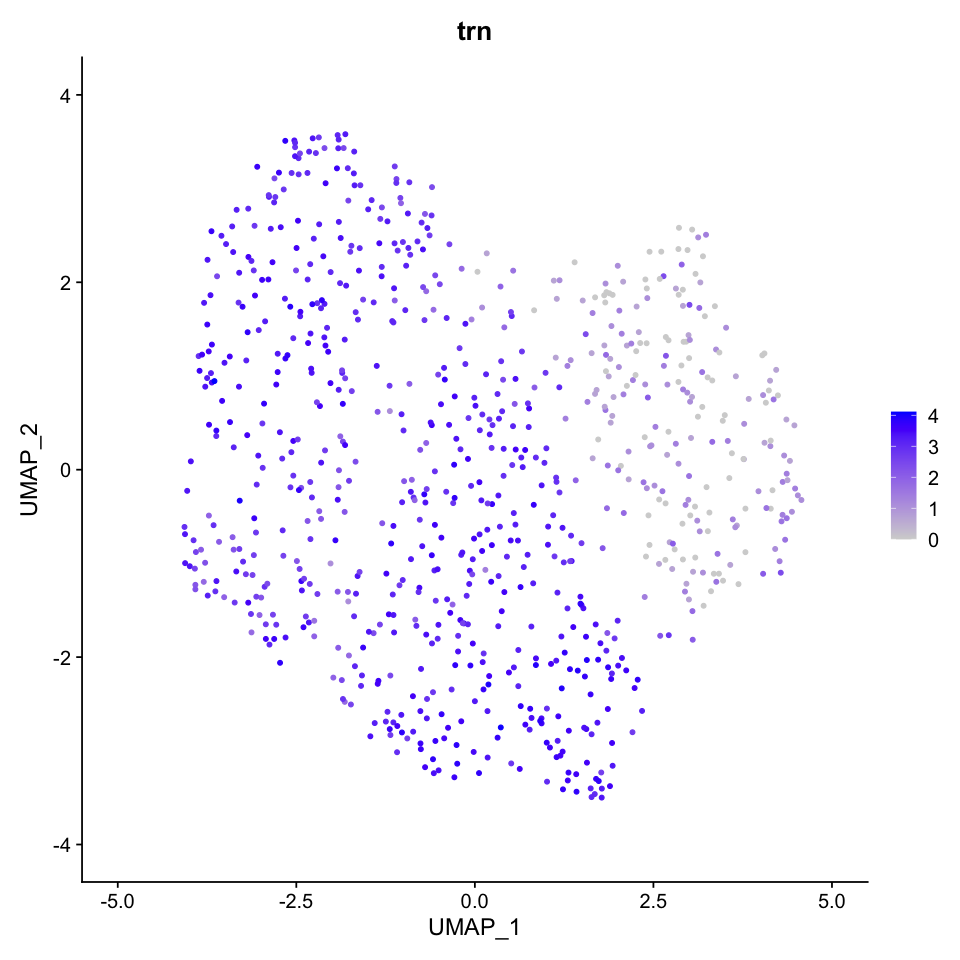

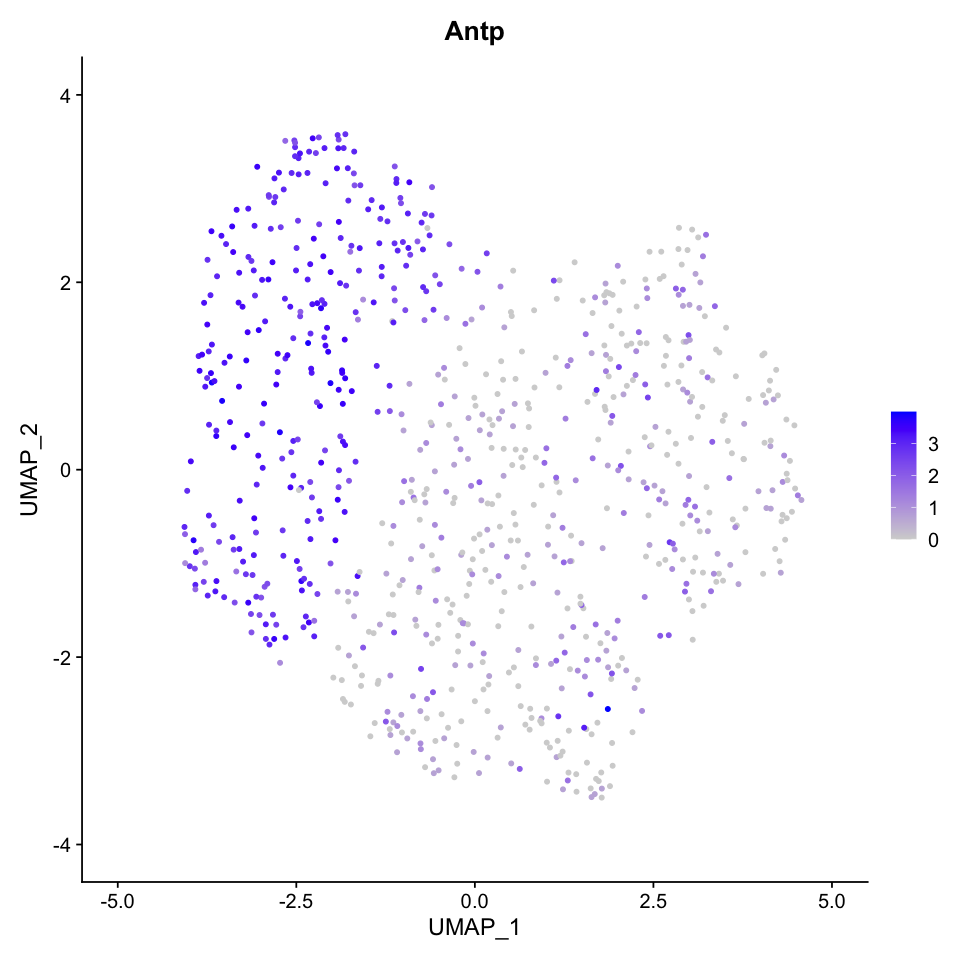

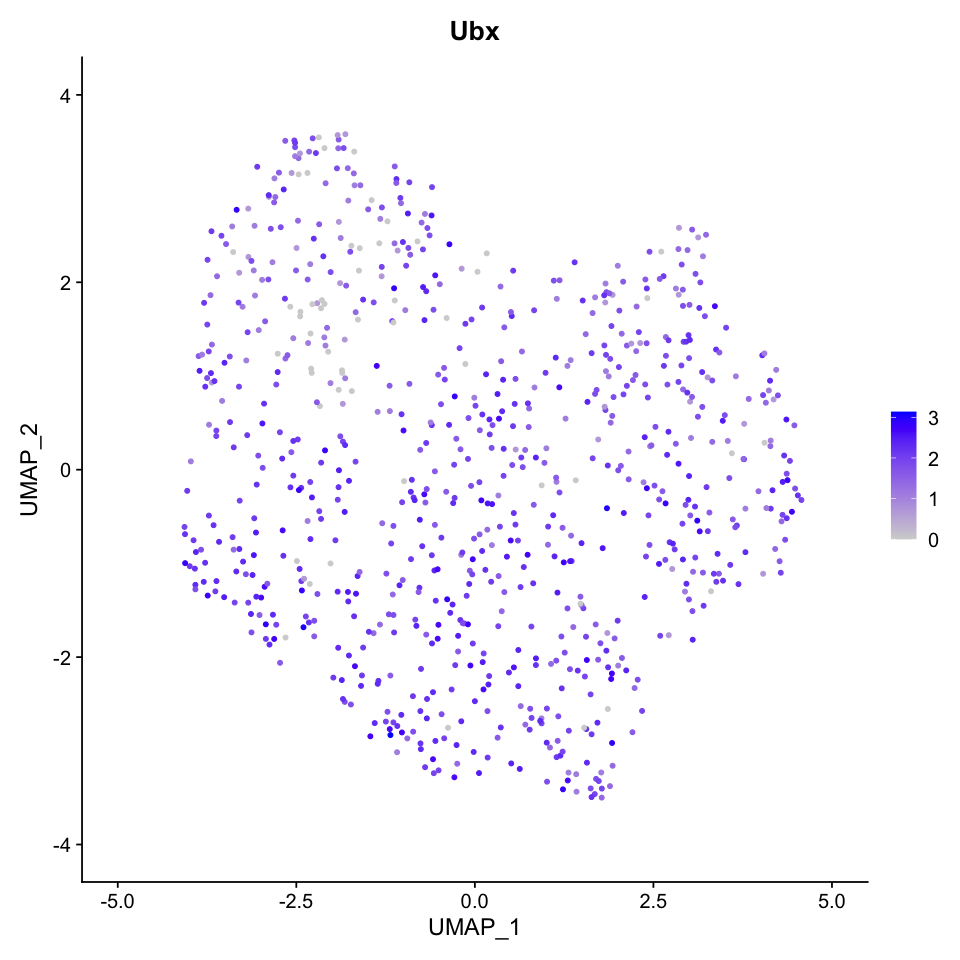

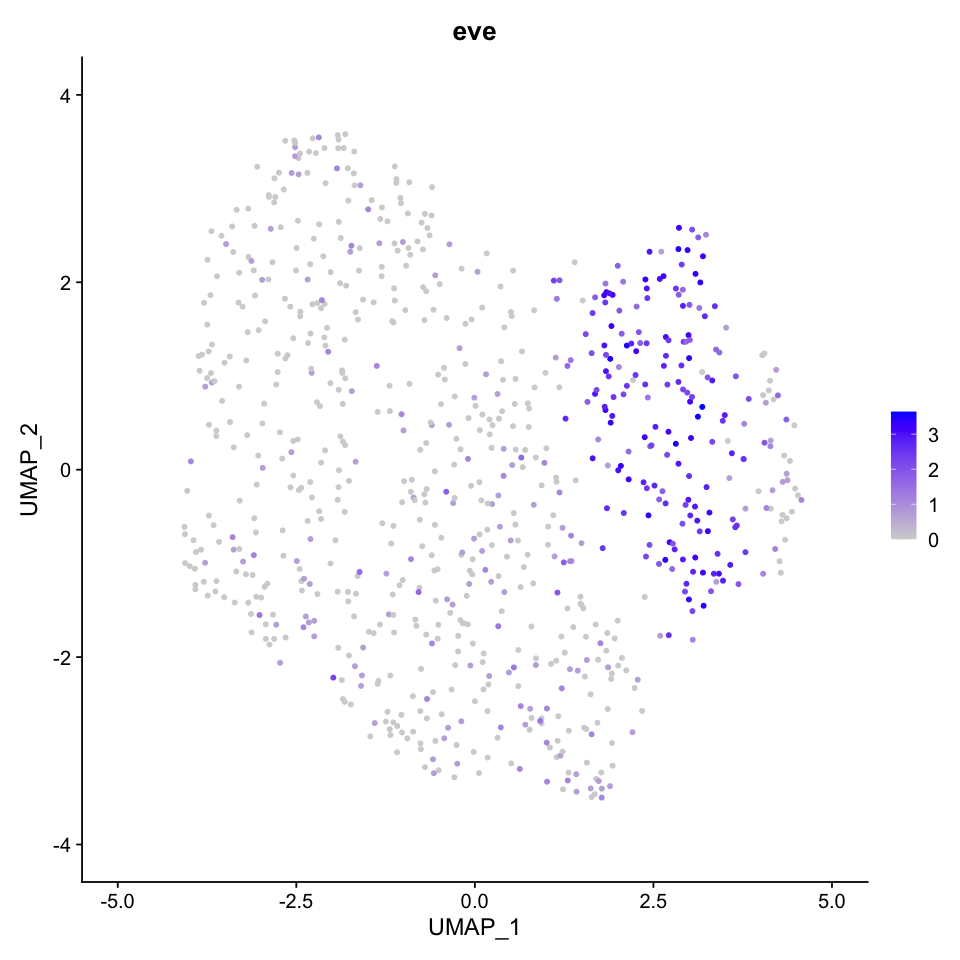

In [37]:
path = './figures/04_meso_subclustering_bcdRNAi'
for (name in c('trn','Antp','Ubx','eve')){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu.trunk.meso, features = name)
    plot(p)
    basename = paste(name, '_bcdRNAi_trunk_meso.eps')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

### Annotate clusters

,manual_ID
,<fct>
AAACGAAGTTCCGCTT,4
AAACGCTGTCAACGCC,3
AAAGGATTCTCAATCT,3
AAAGGGCAGATAACGT,1
AAAGGGCCAGTATTCG,1
AAAGGTAAGCAATTCC,2


,manual_ID
,<fct>
AAACGAAGTTCCGCTT,mesoderm_abdominal_even
AAACGCTGTCAACGCC,mesoderm_PS6
AAAGGATTCTCAATCT,mesoderm_PS6
AAAGGGCAGATAACGT,mesoderm_abdominal_even
AAAGGGCCAGTATTCG,mesoderm_abdominal_even
AAAGGTAAGCAATTCC,mesoderm_PS6


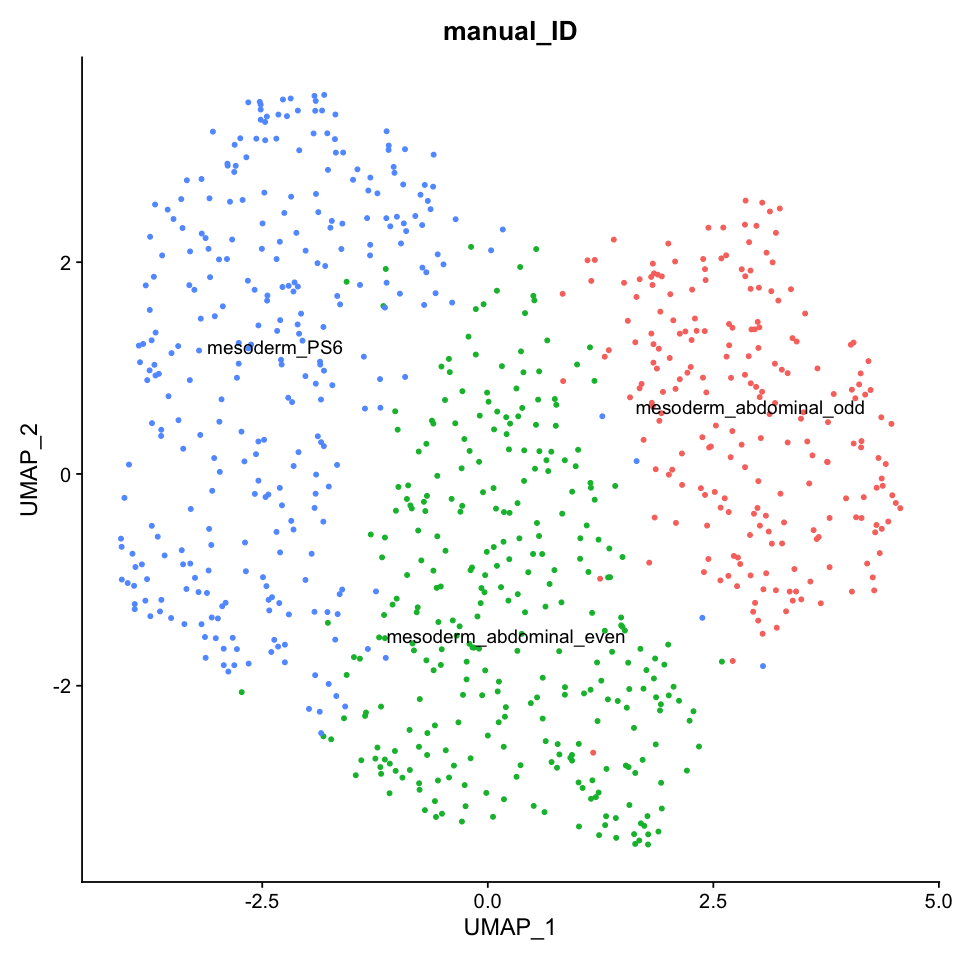

In [38]:
manual_id <- as.data.frame(seu.trunk.meso$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="mesoderm_abdominal_odd", #trn-, Antp-, Ubx+
                                     "1"="mesoderm_abdominal_even", #trn+, Antp-, Ubx+
                                     "2"="mesoderm_PS6", #trn+, Antp-, Ubx+
                                     "3"="mesoderm_PS6", #trn+, Antp+, Ubx+
                                     "4"="mesoderm_abdominal_even", #trn+, Antp+, Ubx+
                                   )
                                    

head(manual_id)
seu.trunk.meso$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

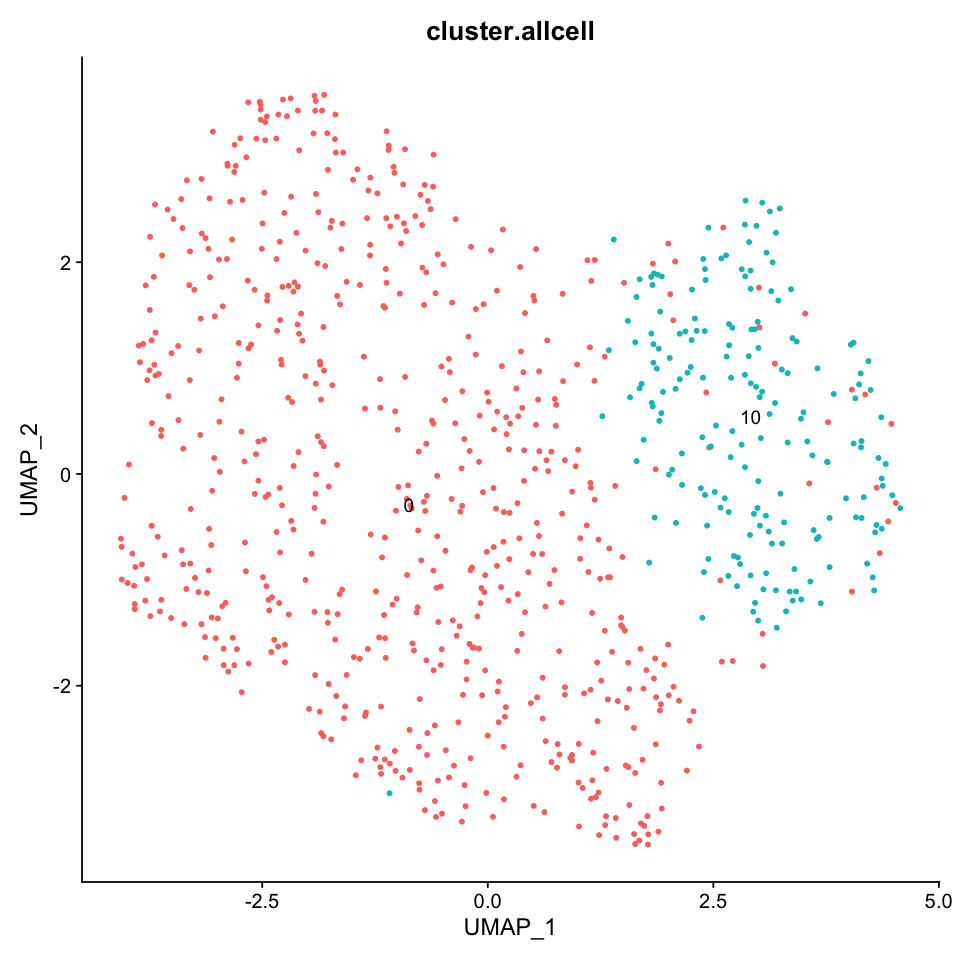

In [39]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso, reduction =  "umap", label = TRUE, group.by = 'cluster.allcell') + NoLegend()

In [40]:
Idents(seu.trunk.meso) <- 'manual_ID'
levels(seu.trunk.meso) <- c('mesoderm_PS6','mesoderm_abdominal_even','mesoderm_abdominal_odd')
all.markers.meso <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

Calculating cluster mesoderm_PS6

Calculating cluster mesoderm_abdominal_even

Calculating cluster mesoderm_abdominal_odd



[1] 62

[1] 30

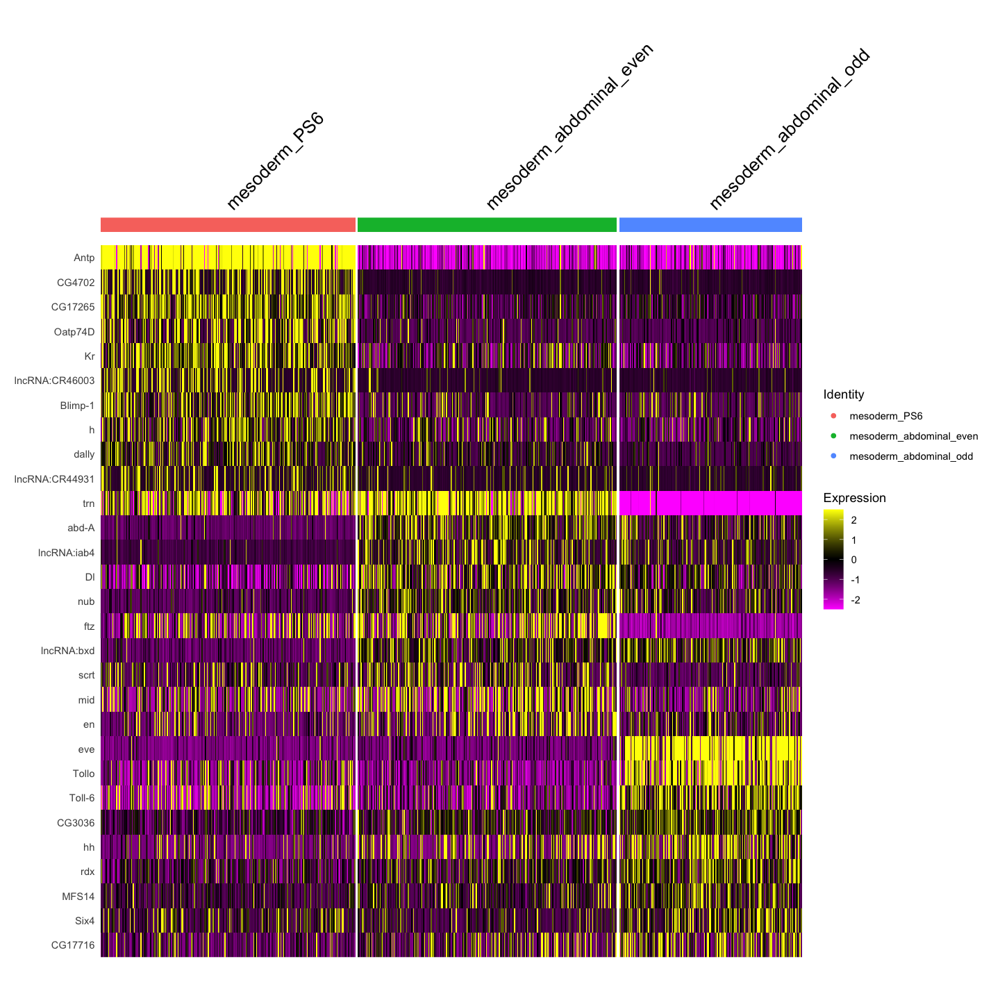

In [41]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene))

Saving 7 x 7 in image



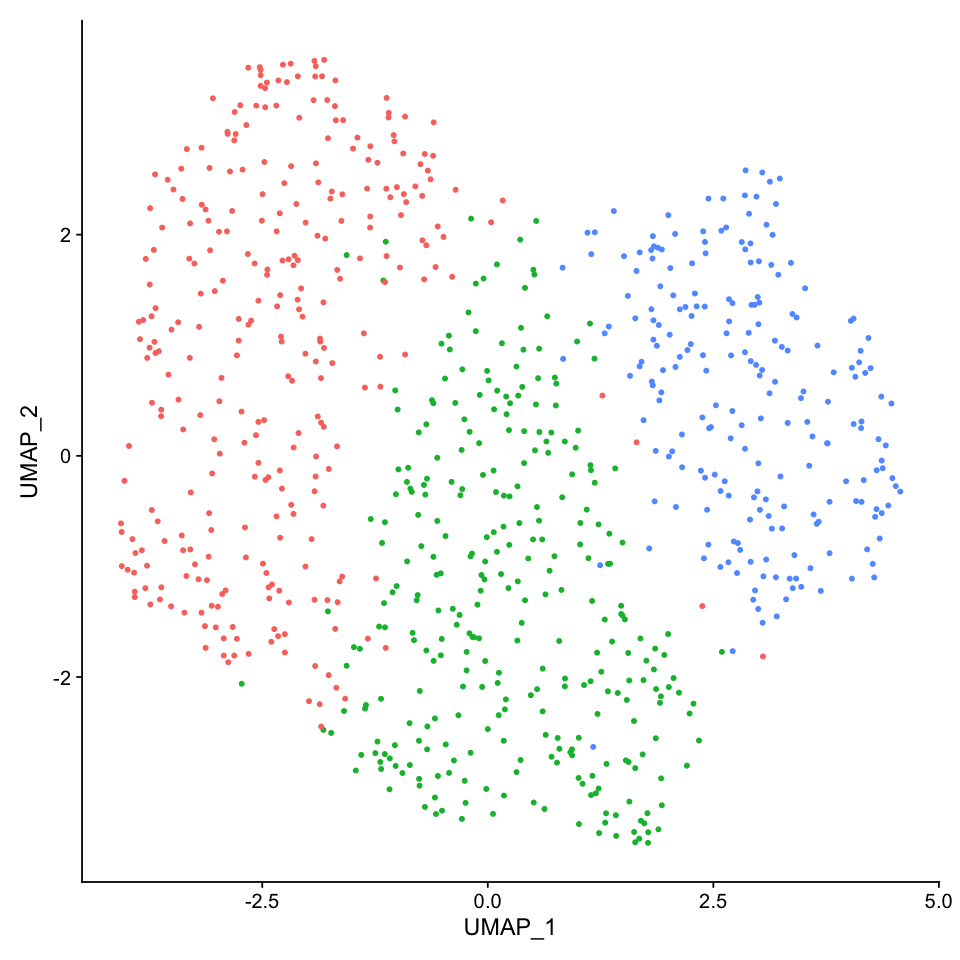

In [42]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/trunk_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



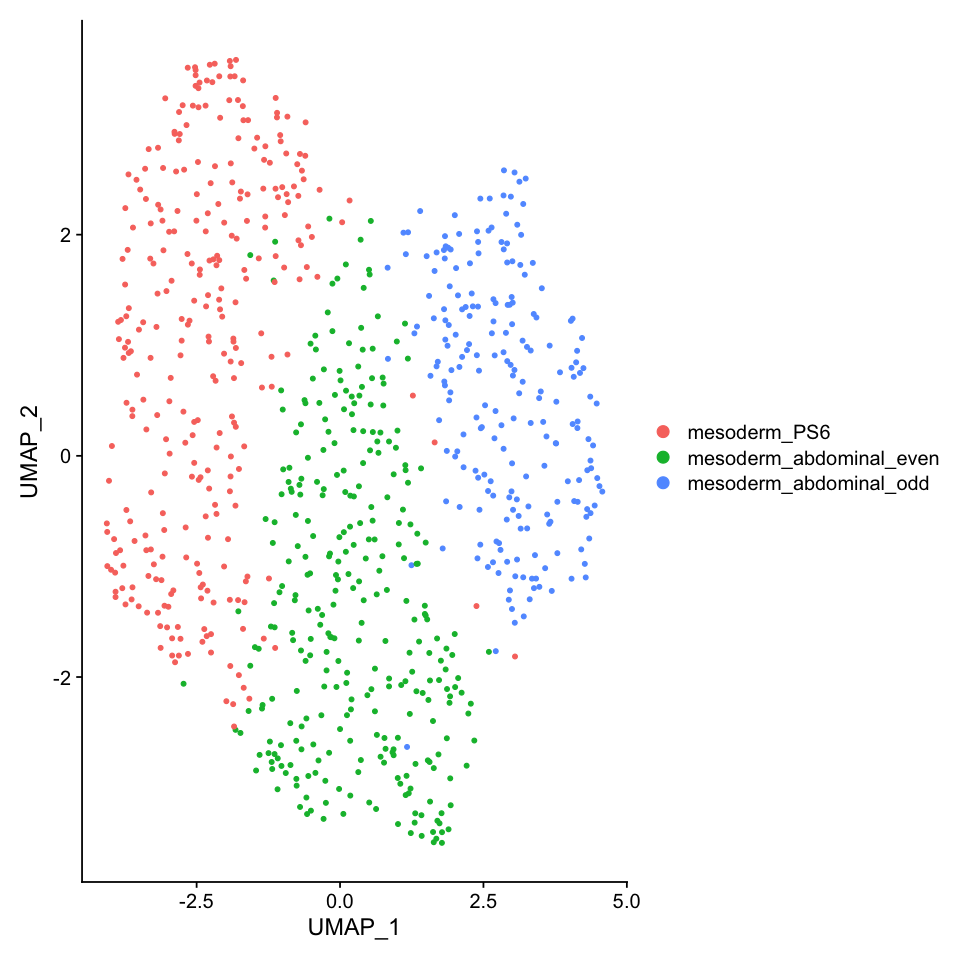

In [43]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/trunk_meso_umap2.eps", dpi = 300)

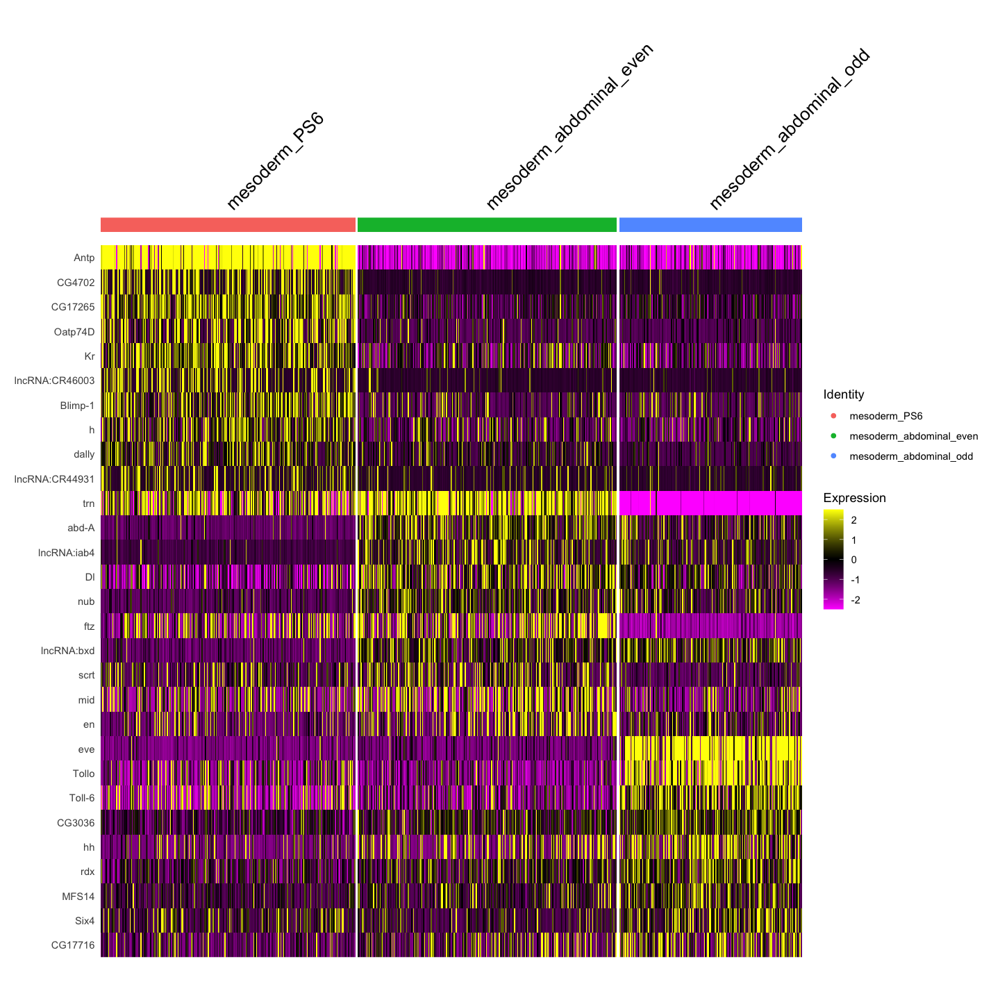

In [44]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.trunk.meso, features = c(all.markers.meso.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/trunk_meso_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

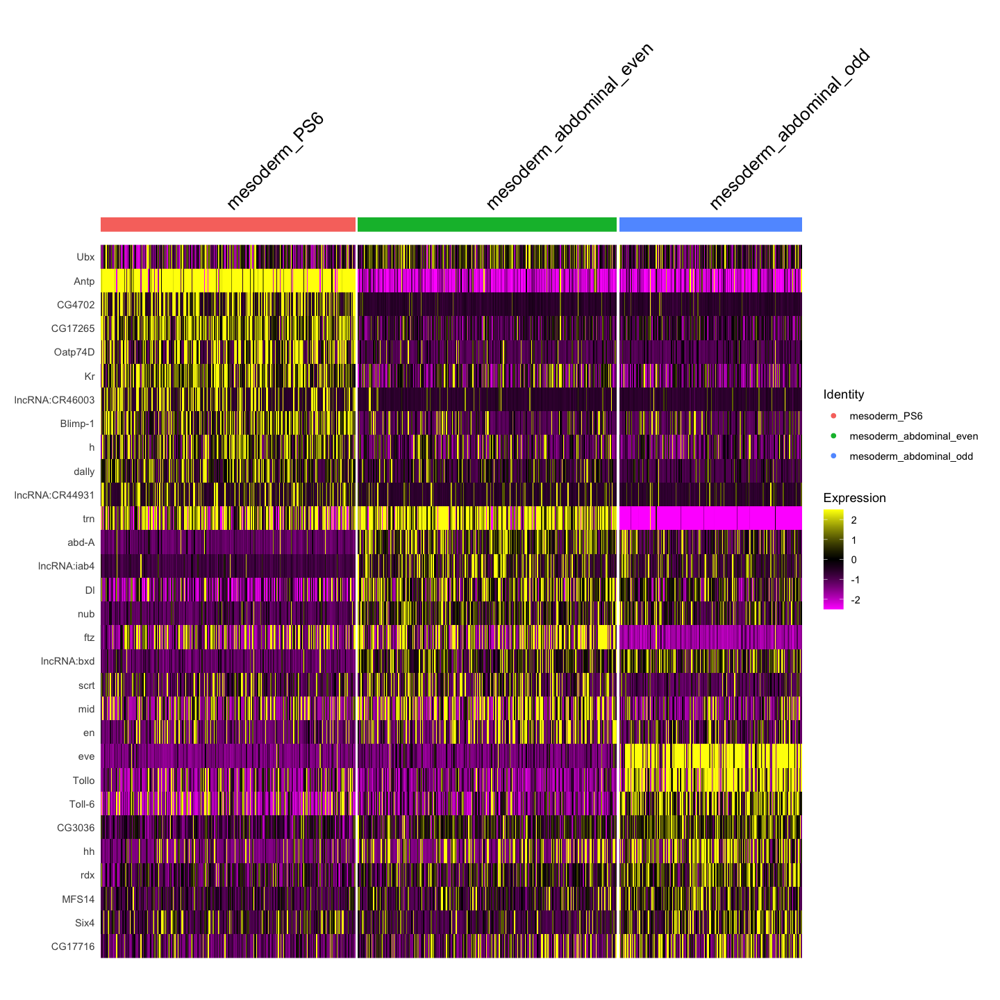

In [45]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.trunk.meso, features = c('Ubx',all.markers.meso.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/trunk_meso_manualID_heatmap_renorm_with_Ubx.eps", dpi = 300,  width = 12, height = 8)

## Mesoderm PS13
### Picking up target clusters

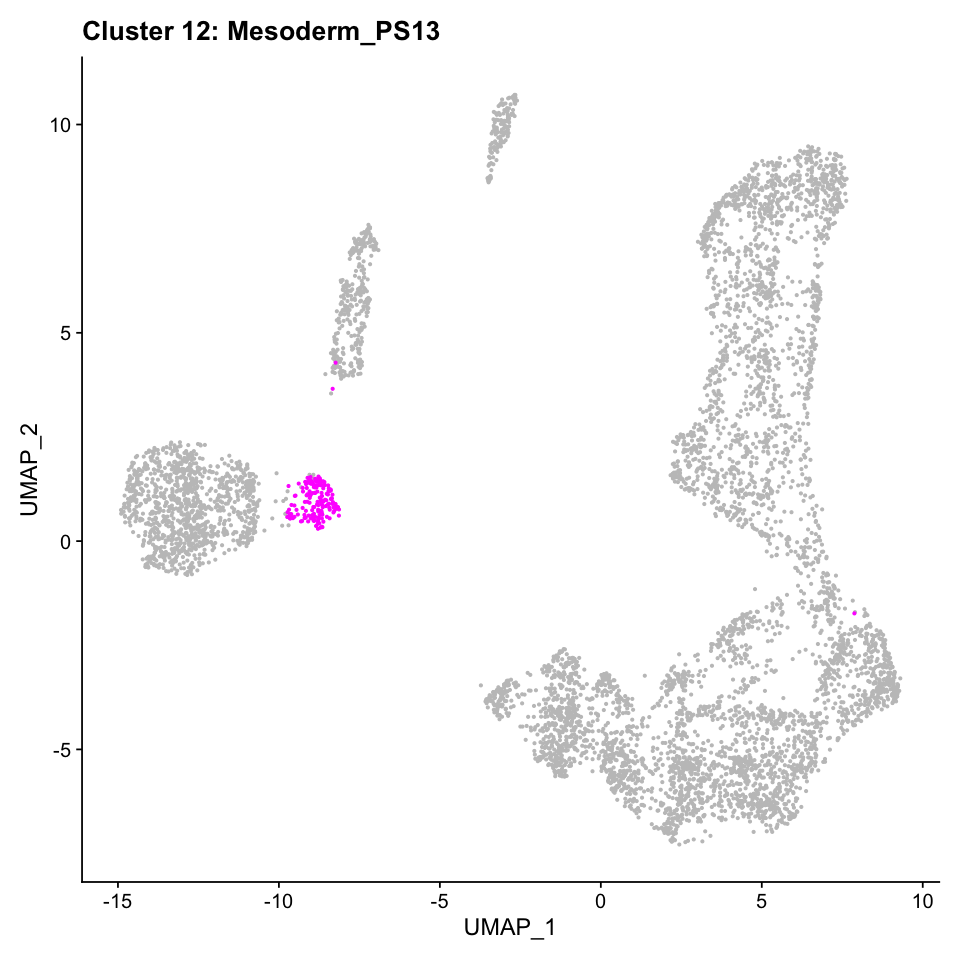

In [46]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(12))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 12: Mesoderm_PS13')

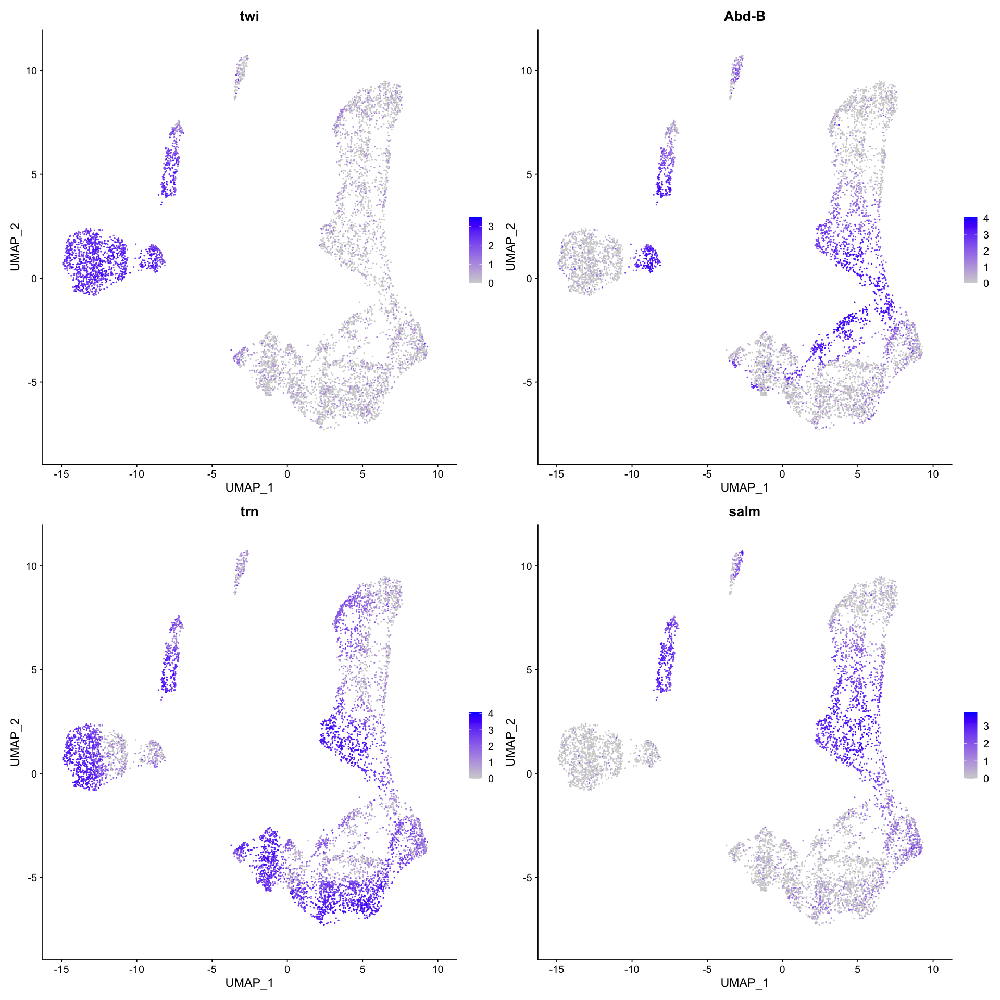

In [47]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'Abd-B', 'trn', 'salm'))

In [48]:
seu.meso.ps13 <- subset(seu_HQC, ident = 12)
seu.meso.ps13

An object of class Seurat 
28612 features across 171 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

### Clustering
Num of cells < 500.  
Skipping re-normalization

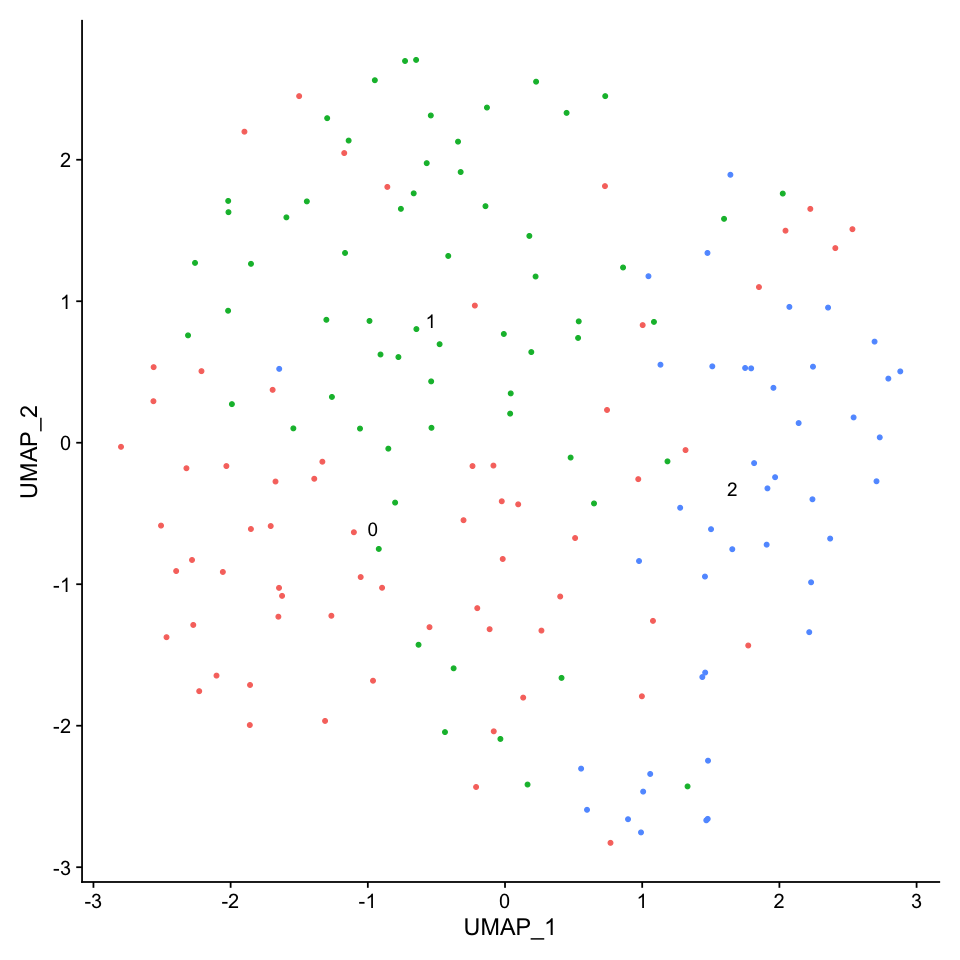

In [49]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.ps13 <- RunPCA(seu.meso.ps13, verbose = FALSE)
seu.meso.ps13 <- RunUMAP(seu.meso.ps13, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu.meso.ps13 <- FindNeighbors(seu.meso.ps13, dims = 1:30, verbose = FALSE)
seu.meso.ps13 <- FindClusters(seu.meso.ps13, verbose = FALSE)
DimPlot(seu.meso.ps13, reduction =  "umap", label = TRUE) + NoLegend()

In [50]:
all.markers <- FindAllMarkers(object = seu.meso.ps13, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



[1] 512

[1] 30

Warning message in DoHeatmap(seu.meso.ps13, features = c(all.markers.top10$gene)):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: snf, mt:ND6”


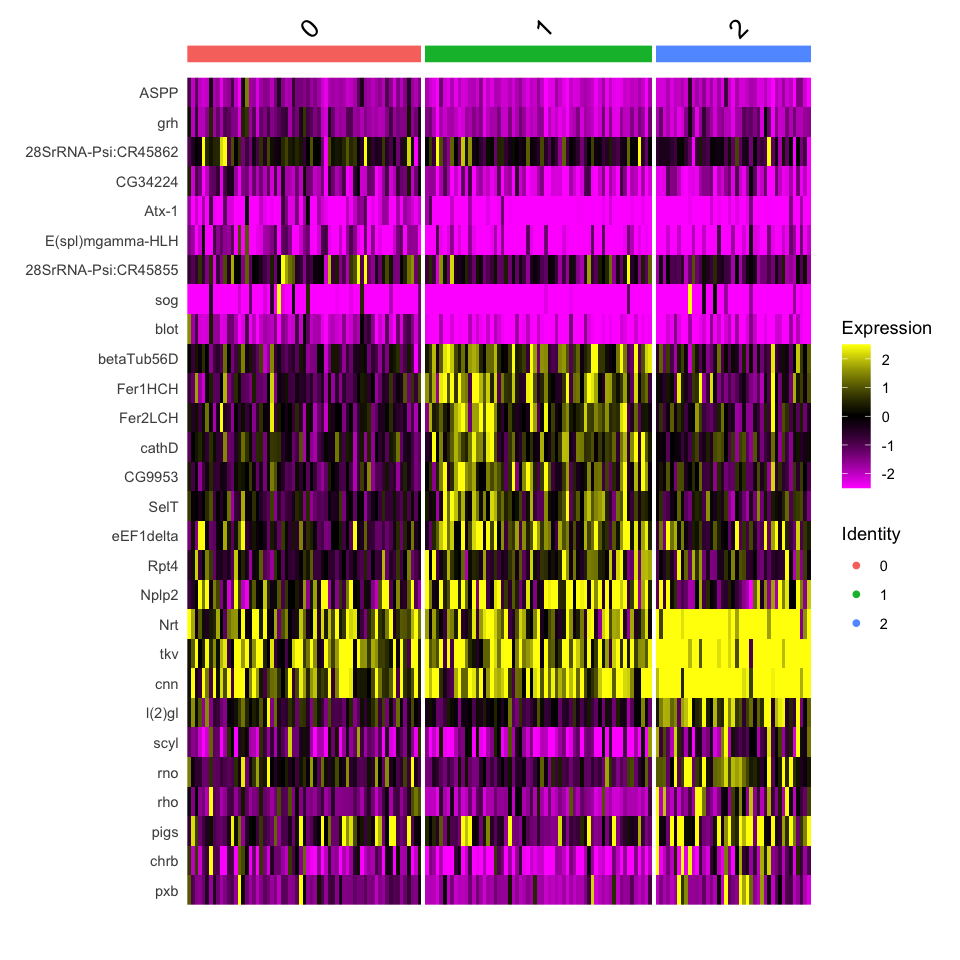

In [51]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.meso.ps13, features = c(all.markers.top10$gene))

No Spatial markers were detecetd

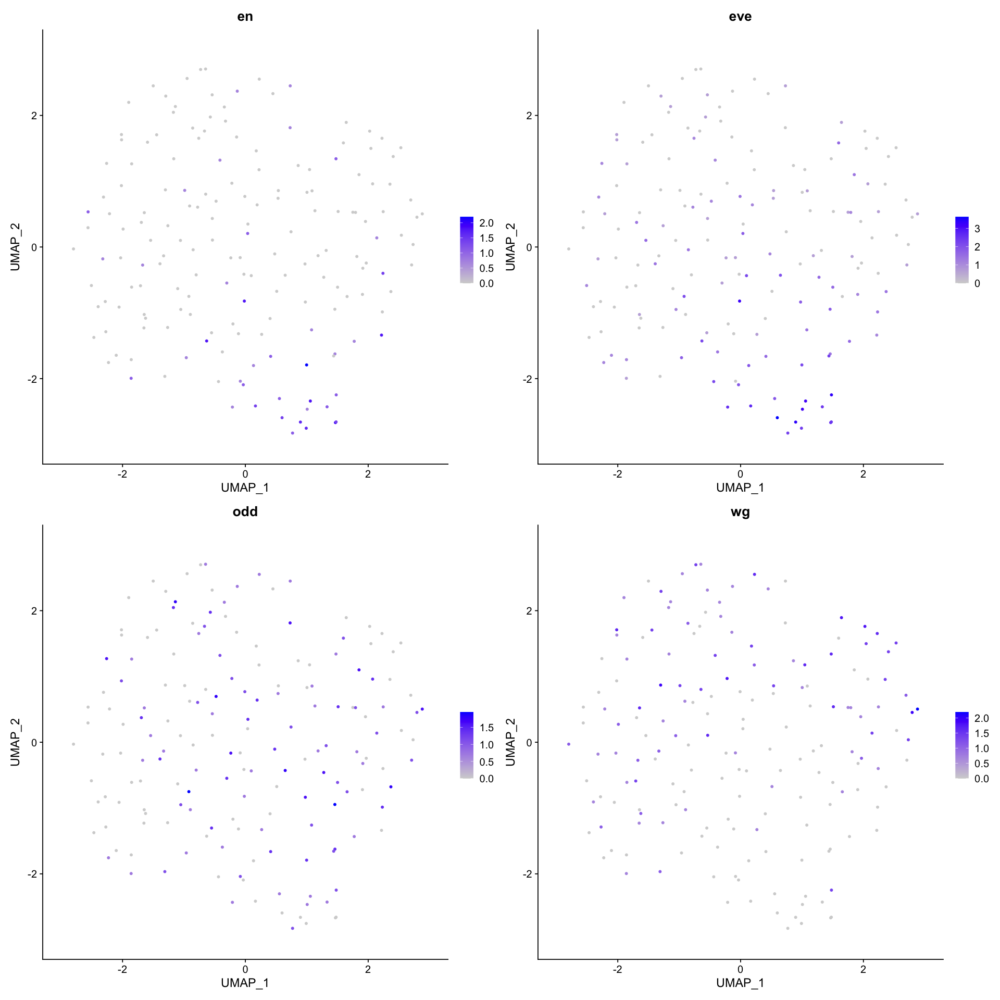

In [52]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.meso.ps13, reduction = 'umap', features = c('en', 'eve','odd', 'wg'))

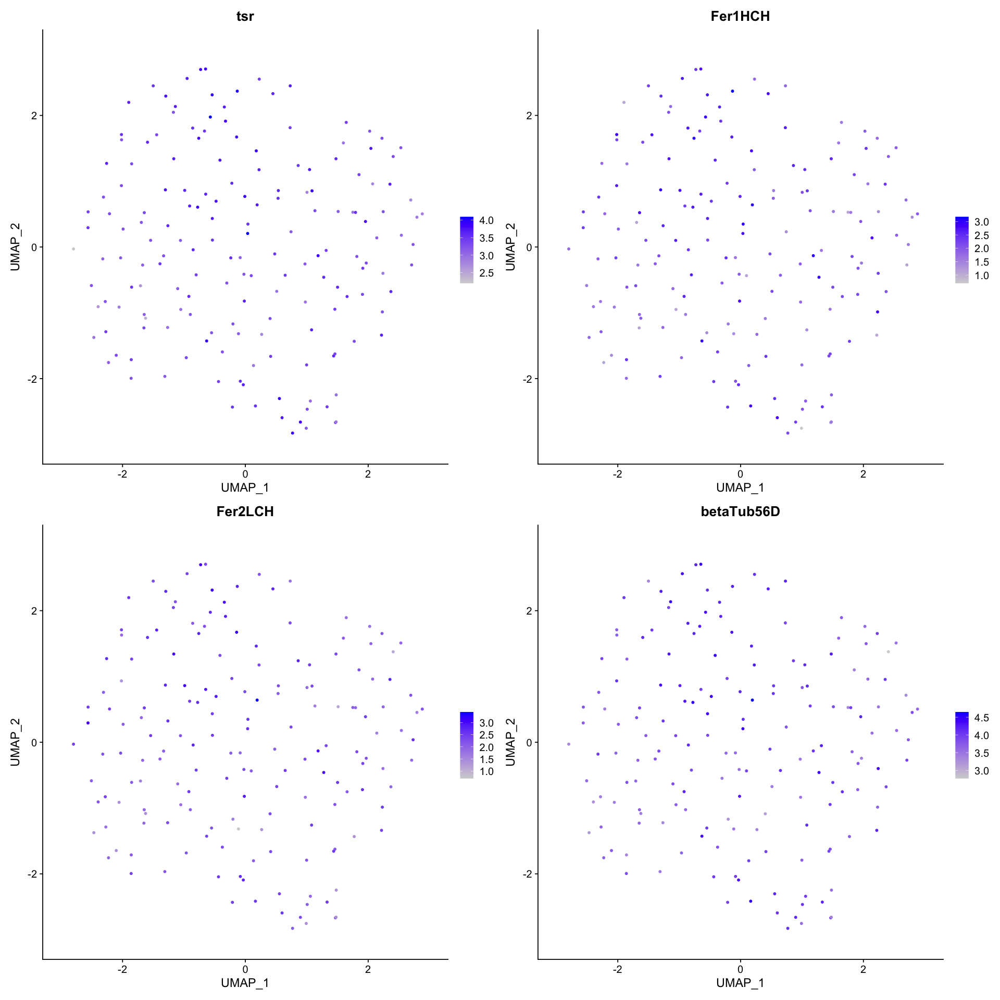

In [53]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.meso.ps13, reduction = 'umap', features = c('tsr', 'Fer1HCH','Fer2LCH', 'betaTub56D'))

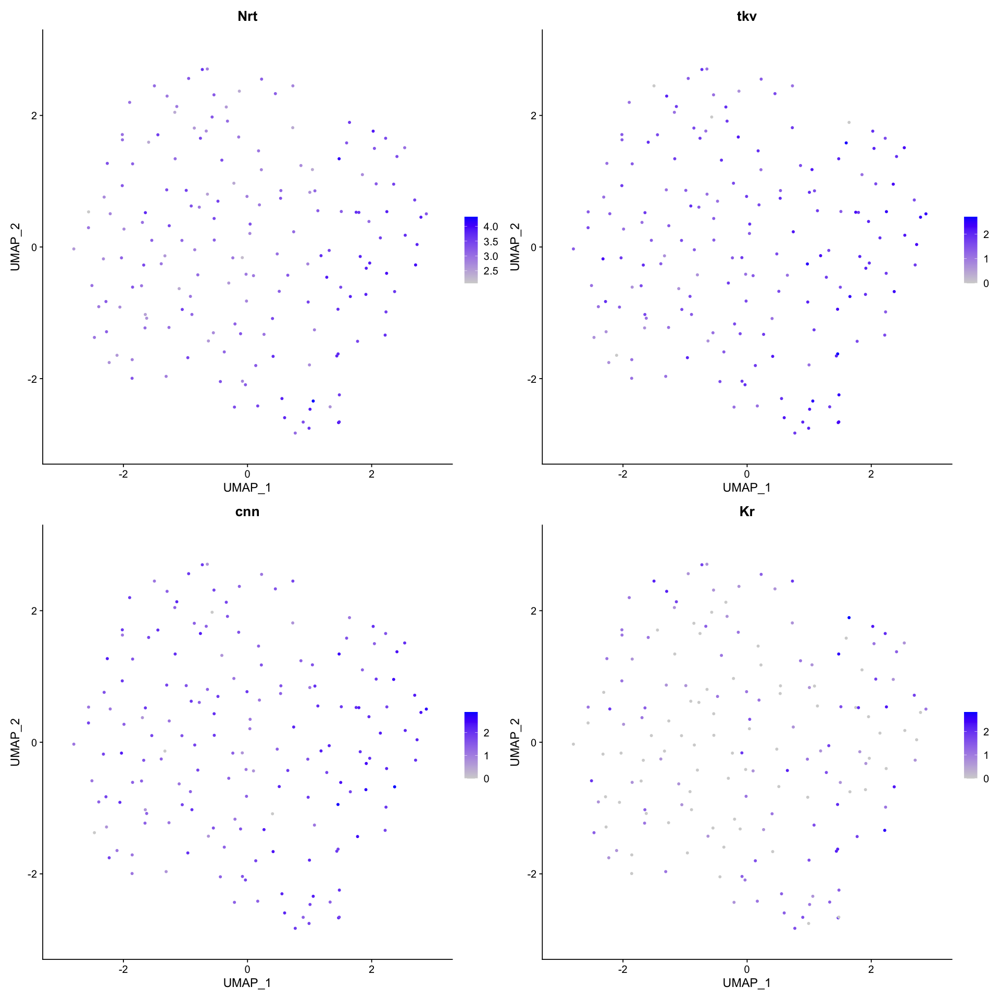

In [54]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.meso.ps13, reduction = 'umap', features = c('Nrt', 'tkv','cnn', 'Kr'))

In [55]:
seu.meso.ps13$manual_ID <- 'mesoderm_PS13'

## Posterior mesoderm
### Picking up target clusters

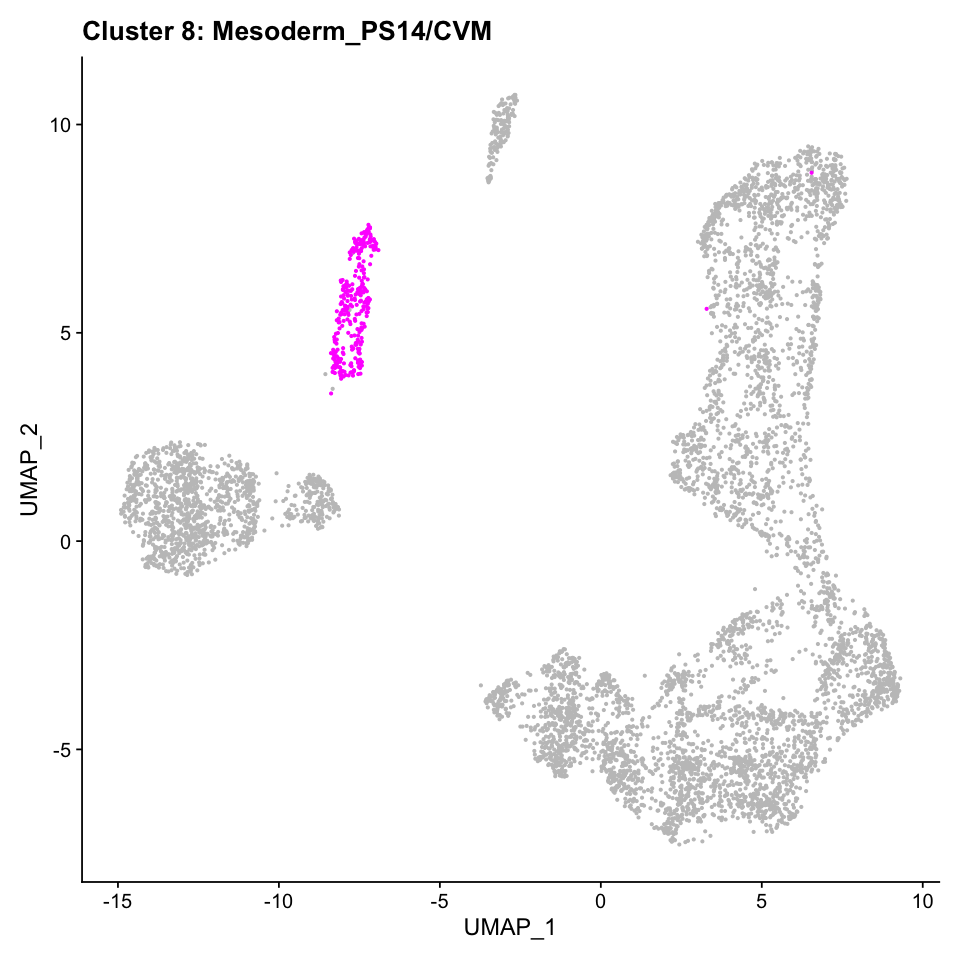

In [56]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(8))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 8: Mesoderm_PS14/CVM')

In [57]:
seu.meso.ps14 <- subset(seu_HQC, ident = 8)
seu.meso.ps14

An object of class Seurat 
28612 features across 313 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

### Clustering
Num of cells < 500. 
Skipping re-normalization

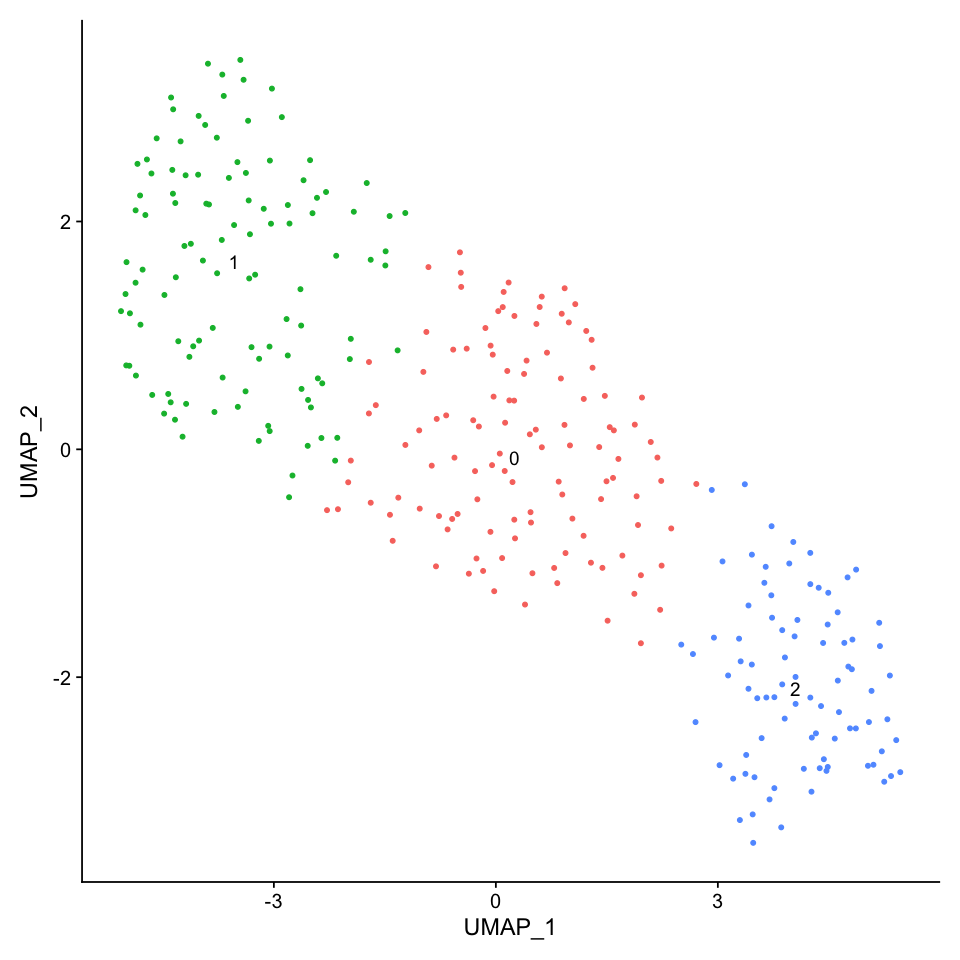

In [58]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.ps14 <- RunPCA(seu.meso.ps14, verbose = FALSE)
seu.meso.ps14 <- RunUMAP(seu.meso.ps14, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu.meso.ps14 <- FindNeighbors(seu.meso.ps14, dims = 1:30, verbose = FALSE)
seu.meso.ps14 <- FindClusters(seu.meso.ps14, verbose = FALSE)
DimPlot(seu.meso.ps14, reduction =  "umap", label = TRUE) + NoLegend()

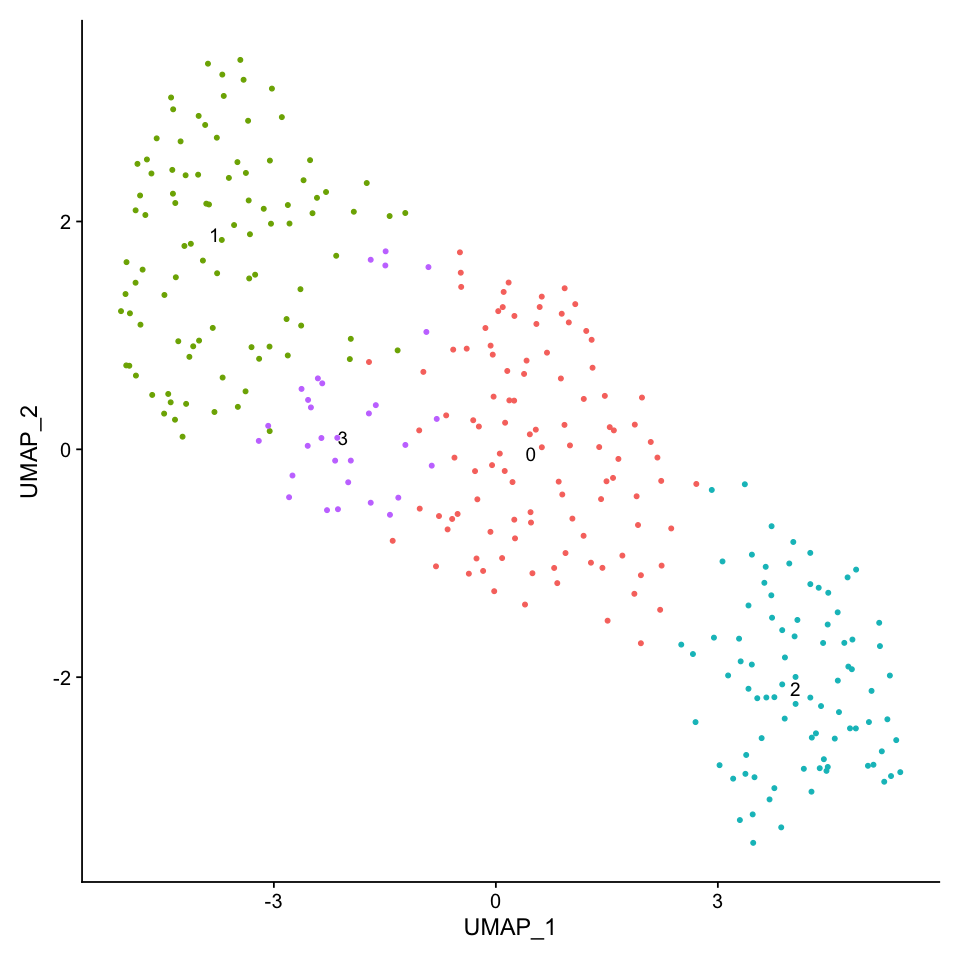

In [59]:
options(repr.plot.width=8, repr.plot.height=8)
seu.meso.ps14 <- FindClusters(seu.meso.ps14, verbose = FALSE, resolution = 1.3)
DimPlot(seu.meso.ps14, reduction =  "umap", label = TRUE) + NoLegend()

In [60]:
levels(seu.meso.ps14) <- c(1,3,0,2)
all.markers <- FindAllMarkers(object = seu.meso.ps14, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 1

Calculating cluster 3

Calculating cluster 0

Calculating cluster 2



[1] 364

[1] 40

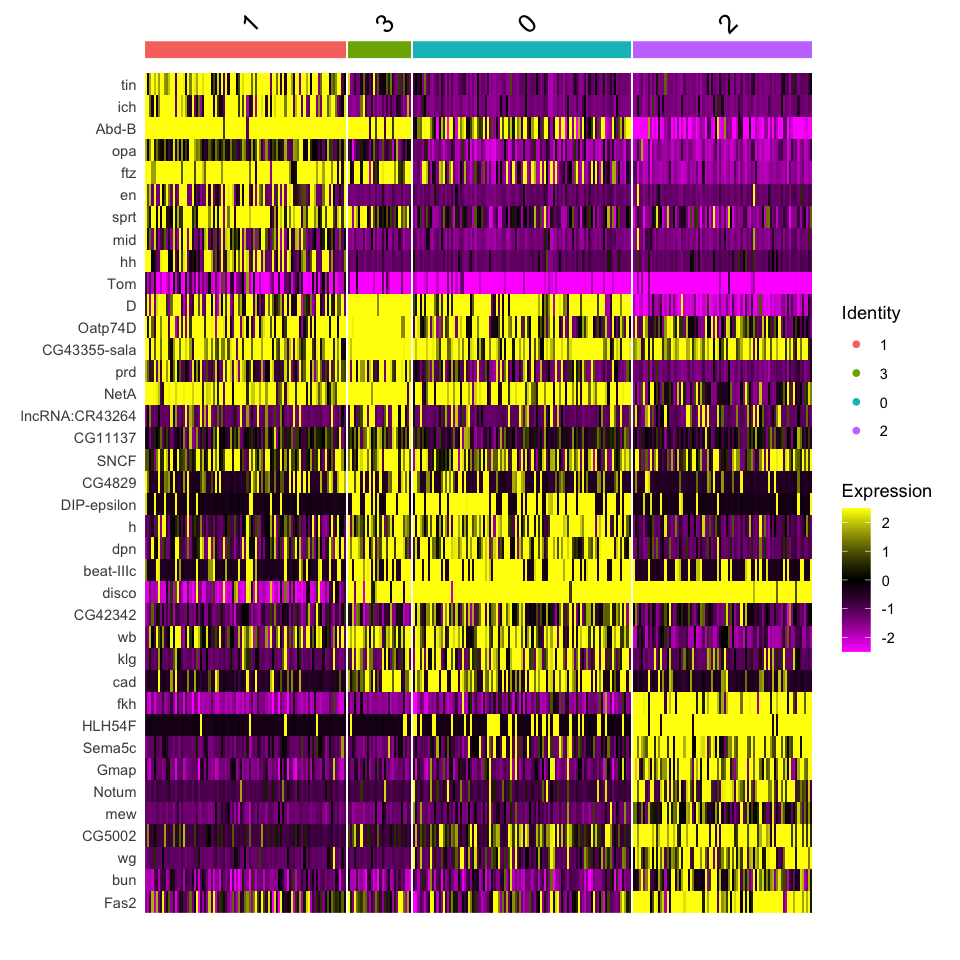

In [61]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.meso.ps14, features = c(all.markers.top10$gene,'ftz'))

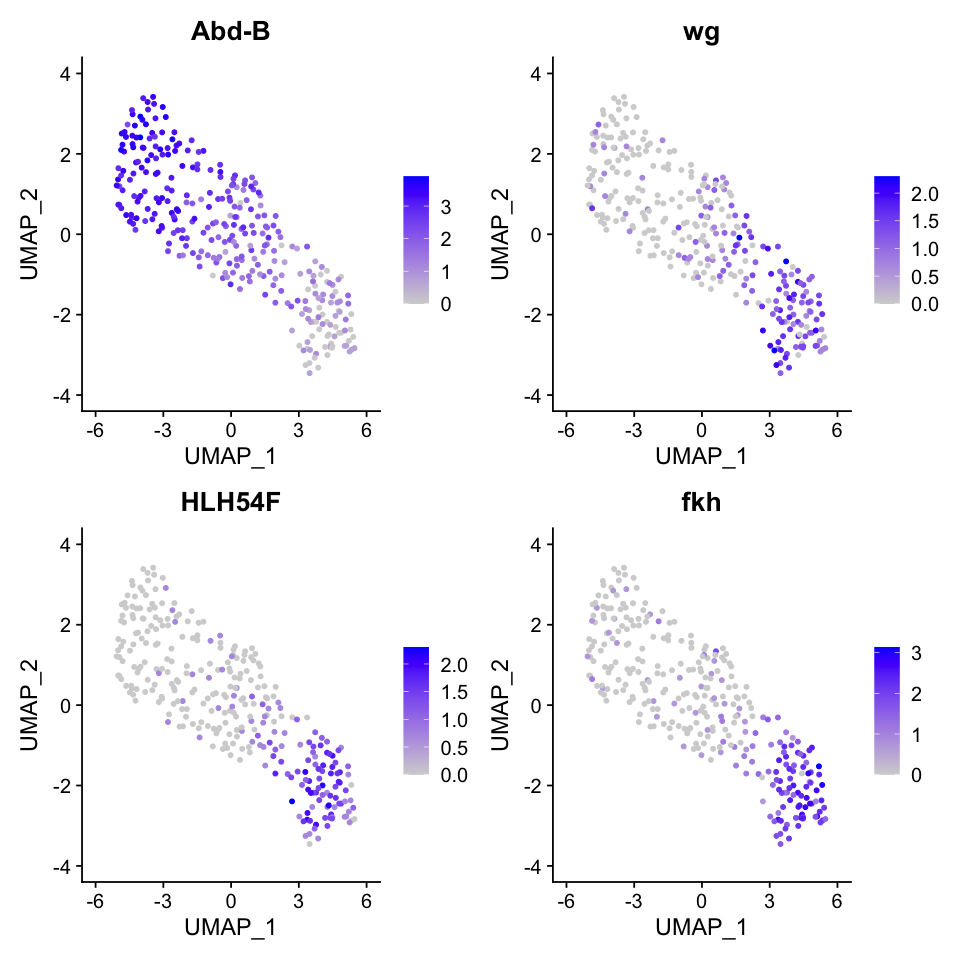

In [62]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.meso.ps14, reduction = 'umap', features = c('Abd-B', 'wg','HLH54F','fkh'))

,manual_ID
,<fct>
AAAGGTACAGTCTCTC,3
AAAGGTAGTTAGAAAC,0
AAAGTCCAGCGTGCCT,2
AAATGGACATTCGATG,0
AACAAAGGTGCACAAG,2
AACAGGGCATGATCTG,0


,manual_ID
,<fct>
AAAGGTACAGTCTCTC,mesoderm_PS14
AAAGGTAGTTAGAAAC,mesoderm_PS14
AAAGTCCAGCGTGCCT,mesoderm_caudal_visceral
AAATGGACATTCGATG,mesoderm_PS14
AACAAAGGTGCACAAG,mesoderm_caudal_visceral
AACAGGGCATGATCTG,mesoderm_PS14


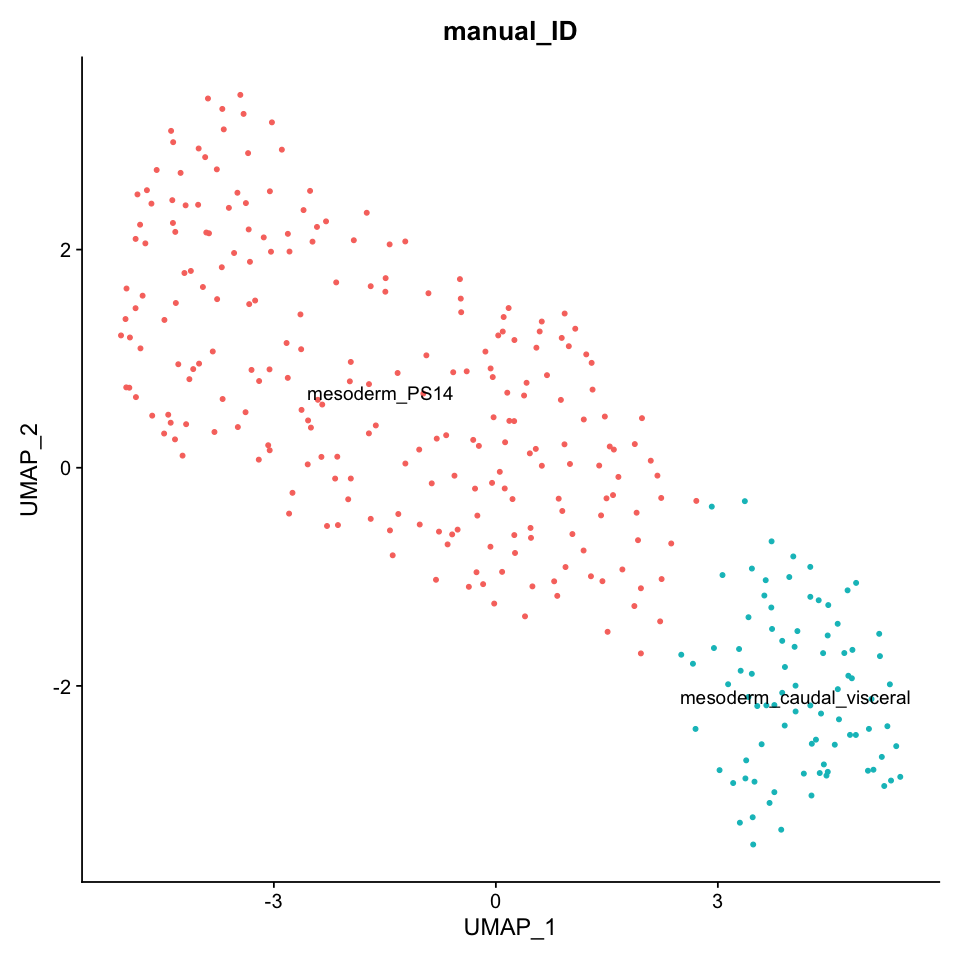

In [63]:
manual_id <- as.data.frame(seu.meso.ps14$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="mesoderm_PS14", #Abd-B+, fkh-
                                     "1"="mesoderm_PS14", #Abd-B+, fkh-
                                     "2"="mesoderm_caudal_visceral", #Abd-B-, fkh+, HLH54F+
                                     "3"="mesoderm_PS14", #Abd-B+, fkh-
                                   )
                                    

head(manual_id)
seu.meso.ps14$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.ps14, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [64]:
Idents(seu.meso.ps14) <- 'manual_ID'
all.markers <- FindAllMarkers(object = seu.meso.ps14, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_PS14

Calculating cluster mesoderm_caudal_visceral



[1] 199

[1] 20

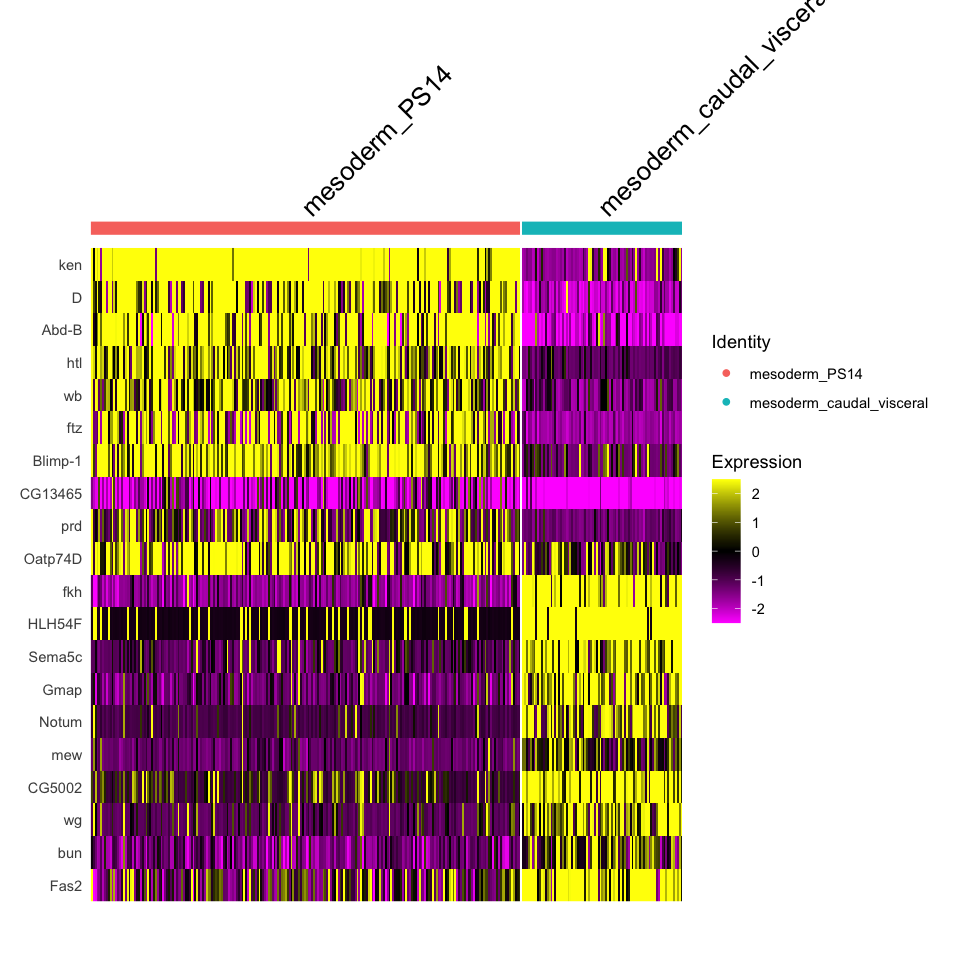

In [65]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.meso.ps14, features = c(all.markers.top10$gene))

Saving 7 x 7 in image



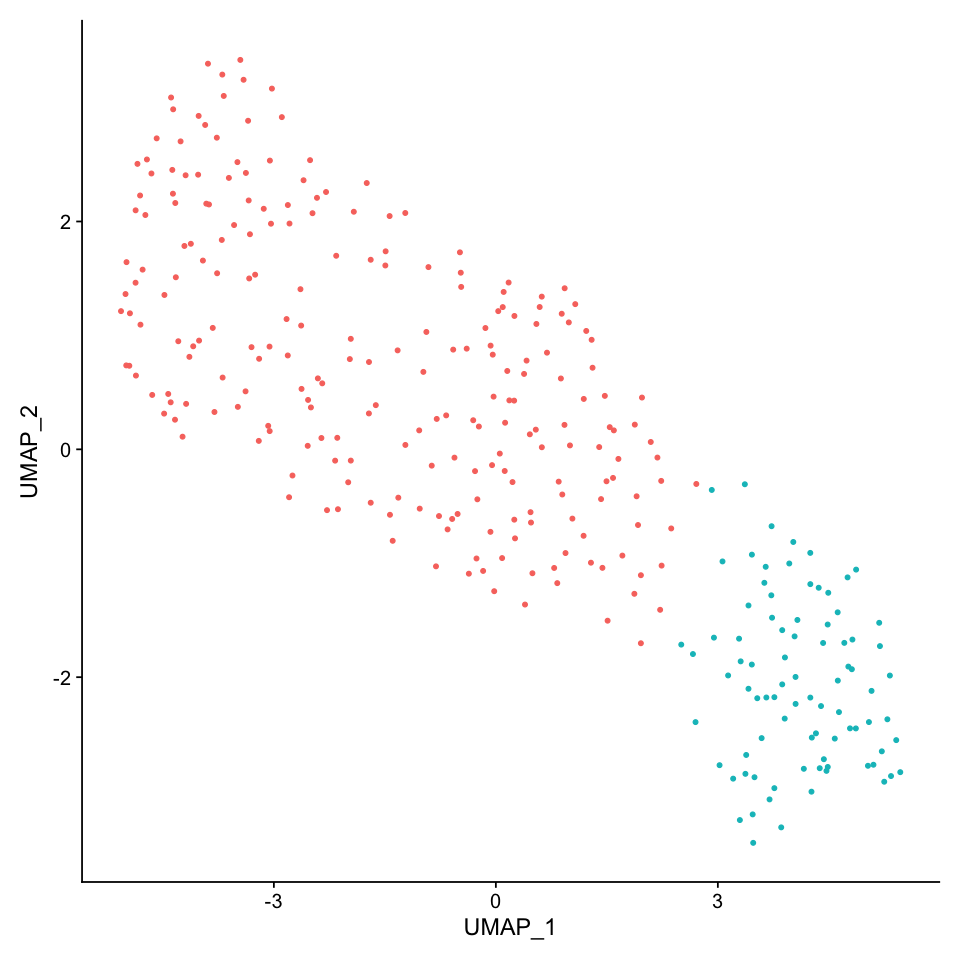

In [66]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.ps14, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/post_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



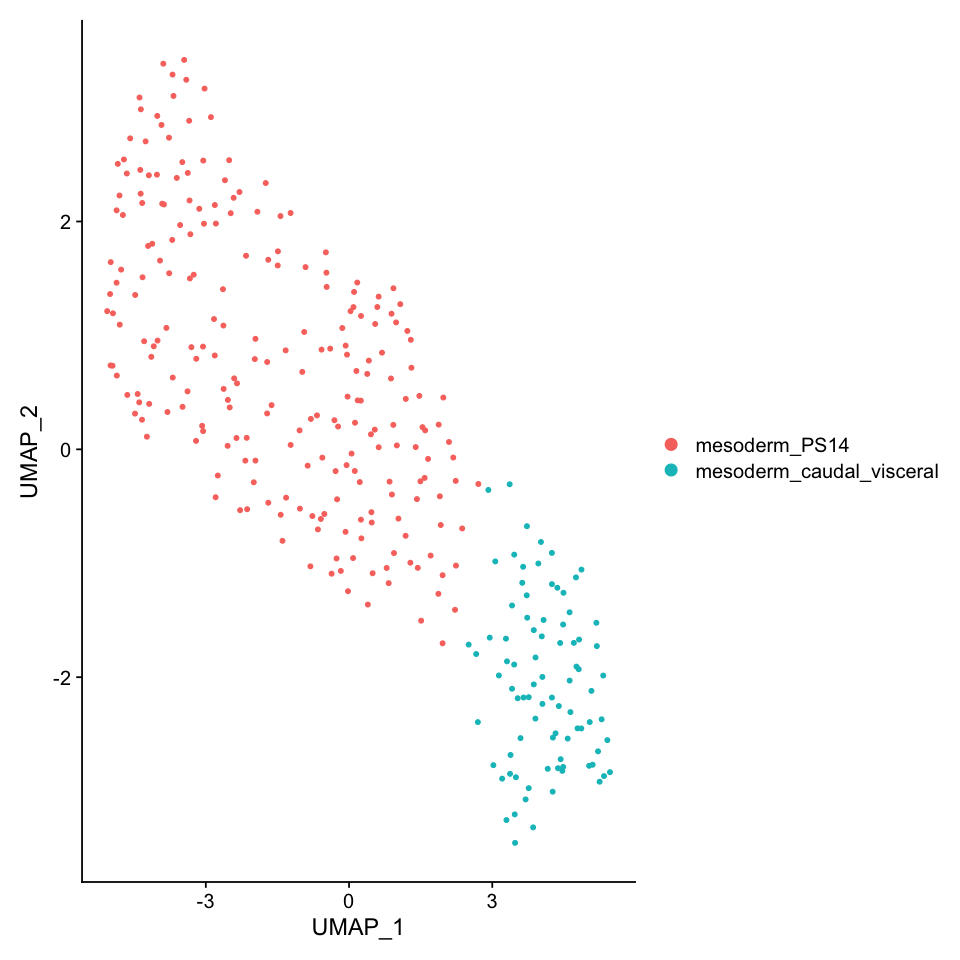

In [67]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.ps14, reduction =  "umap", label = FALSE) 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/post_meso_umap2.eps", dpi = 300)

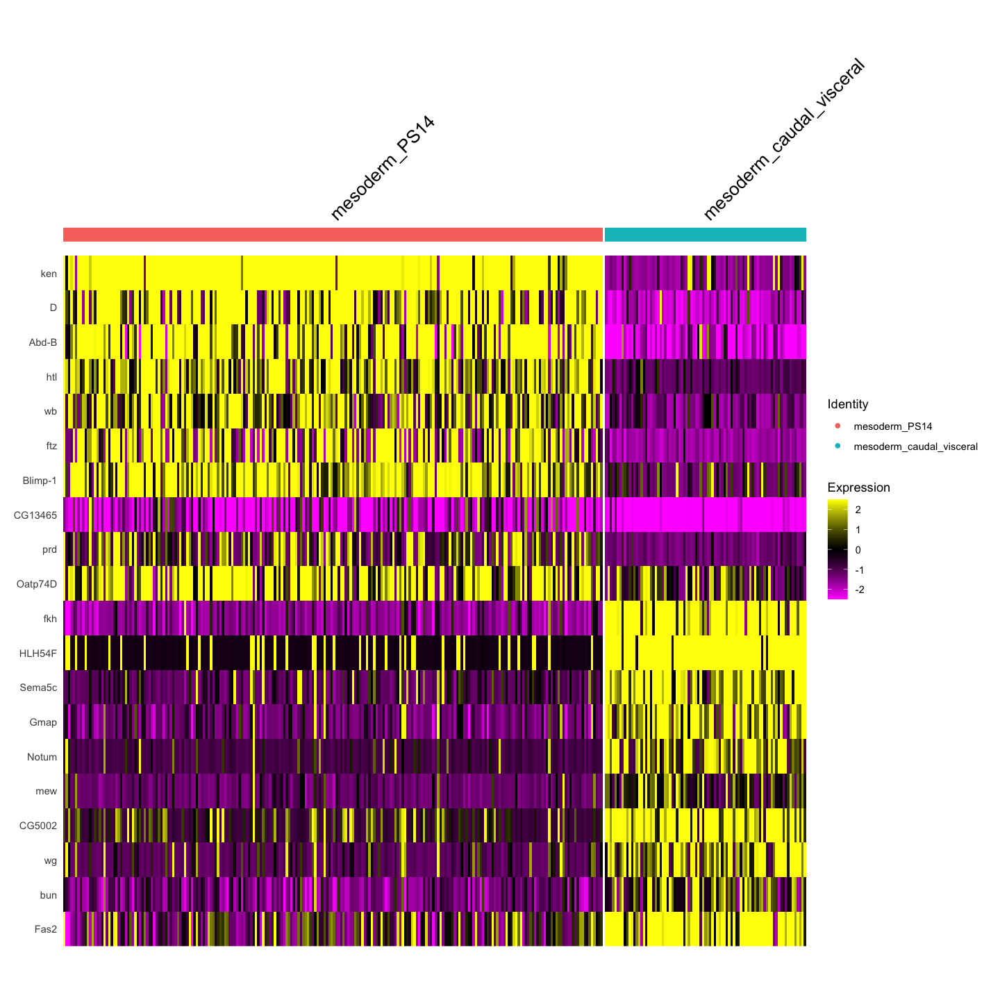

In [68]:
options(repr.plot.width=12, repr.plot.height=12)
fig <- DoHeatmap(seu.meso.ps14, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_bcdRNAi/post_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

In [69]:
seu.merge <- merge(x = seu.trunk.meso,y = c(seu.meso.ps13,seu.meso.ps14,
                   seu.stressed.cells,  seu.doublet))
seu.save <- subset(seu_HQC, idents = c(0,10,8,12))
seu.save$manual_ID <- seu.merge$manual_ID
seu.save

An object of class Seurat 
28612 features across 1594 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

In [70]:
seu.others <- subset(seu_HQC, cells = colnames(seu.merge), invert = T)
seu.others$manual_ID <- 'others'
seu.merge <- merge(seu.merge, seu.others)
seu_HQC$manual_ID <- seu.merge$manual_ID

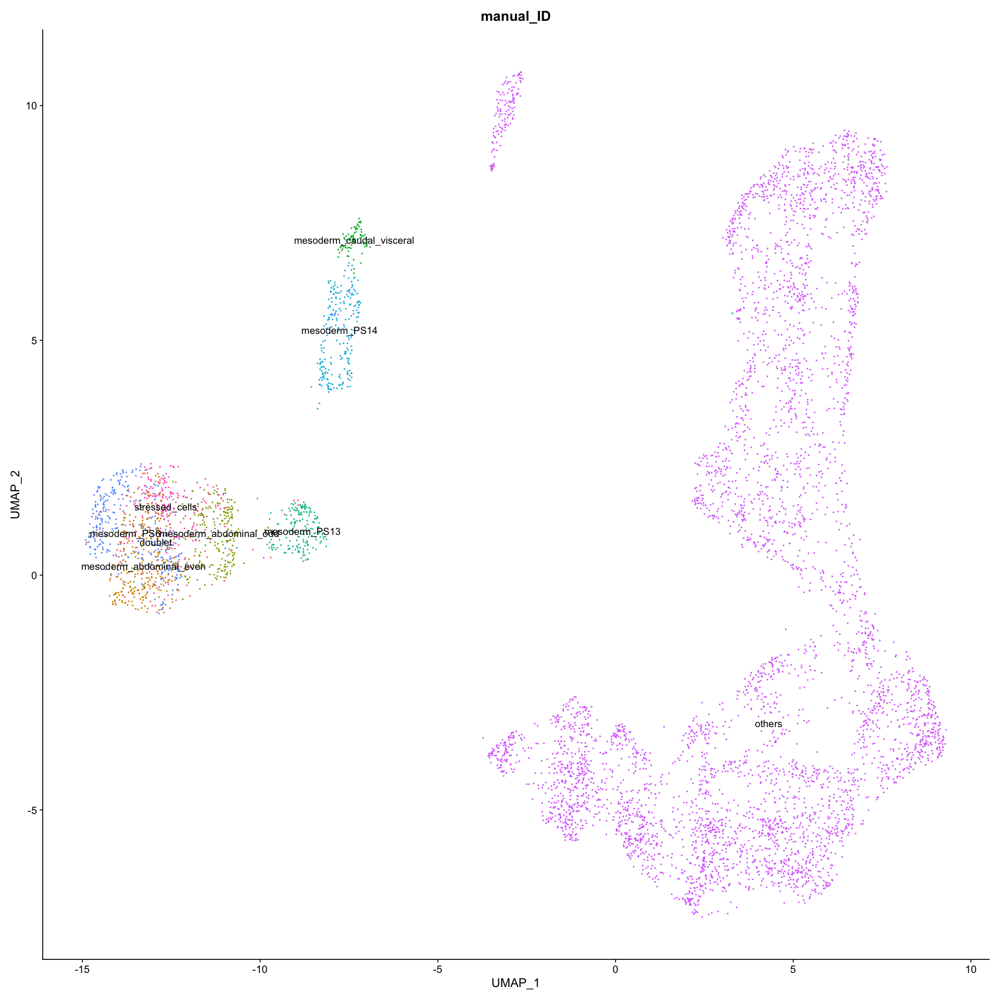

In [71]:
options(repr.plot.width=16, repr.plot.height=16)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'manual_ID') + NoLegend()

In [72]:
saveRDS(seu.save, file = '../../data/seurat_object/bcdRNAi/subclustering/subclustering_meso_bcdRNAi.obj')